In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# l2cs 패키지 설치

In [41]:
# l2cs 패키지 설치
# !pip install git+https://github.com/Ahmednull/L2CS-Net.git@main

In [5]:
# !pip install koreanize_matplotlib

In [2]:
import os
import pandas as pd

yaw_pitch_path = '/content/drive/MyDrive/DMS/data/EDA/yaw_pitch_final'
df_12 = pd.read_csv(os.path.join(yaw_pitch_path, 'final_df_12_yaw_pitch.csv'))
df_24 = pd.read_csv(os.path.join(yaw_pitch_path, 'final_df_24_yaw_pitch.csv'))

<ipython-input-2-61b2d4c84092>:5: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df_12 = pd.read_csv(os.path.join(yaw_pitch_path, 'final_df_12_yaw_pitch.csv'))


# 샘플 프레임 이미지에 l2cs yaw, pitch 추출 테스트

In [42]:
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from l2cs import Pipeline, render

def apply_l2cs_to_image(image_path, save_result=False, output_path=None):
    model_path = '/content/drive/MyDrive/DMS/L2CSNET/L2CSNet_gaze360.pkl'

    # 모델 가중치 파일이 없는 경우 다운로드 안내
    if not os.path.exists(model_path):
        print(f"모델 가중치 파일이 없습니다: {model_path}")
        return

    # 디바이스 설정 (GPU 또는 CPU)
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

    # 파이프라인 초기화
    gaze_pipeline = Pipeline(
        weights=model_path,
        arch='ResNet50',
        device=device
    )

    # 이미지 로드
    image = cv2.imread(image_path)
    if image is None:
        print(f"이미지를 로드할 수 없습니다: {image_path}")
        return

    # BGR에서 RGB로 변환 (시각화를 위해)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # 이미지 처리 및 시선 예측
    results = gaze_pipeline.step(image)

    # 결과 시각화
    output_image = render(image_rgb.copy(), results)

    if results is not None:
        yaw = results.pitch[0]
        pitch = results.yaw[0]

        yaw_deg = np.degrees(yaw)  # np.degrees 함수 사용
        pitch_deg = np.degrees(pitch)

        # 텍스트로 yaw, pitch 표시 추가
        text = f"Yaw: {yaw_deg:.2f}, Pitch: {pitch_deg:.2f}"
        cv2.putText(
            output_image, text,
            (10, 30),  # 왼쪽 상단 (x=10, y=30)
            cv2.FONT_HERSHEY_SIMPLEX,
            0.5,             # 폰트 크기
            (255, 0, 0),     # 파란색
            2,               # 두께
            cv2.LINE_AA
        )
        print(f"yaw radian: {yaw}, pitch radian: {pitch}")

        # 결과 출력
        plt.figure(figsize=(5, 5))
        plt.imshow(output_image)
        plt.axis('off')
        plt.title('L2CS-Net Gaze Detection Result (in Degrees)')
        plt.show()

        bbox = results.bboxes[0]
        landmarks = results.landmarks[0]
        score = results.scores[0]

        return pitch, yaw, bbox, landmarks, score

    else:
        print("얼굴이 감지되지 않았습니다.")
        return None

df_12 values [ yaw radian: -0.2895319759845733, pitch radian: 0.0932340696454048 ]
df_12 values [ yaw degree: -16.588960257999158, pitch degree: 5.341918697510475 ]
yaw radian: -0.3121661841869354, pitch radian: 0.09082231670618057


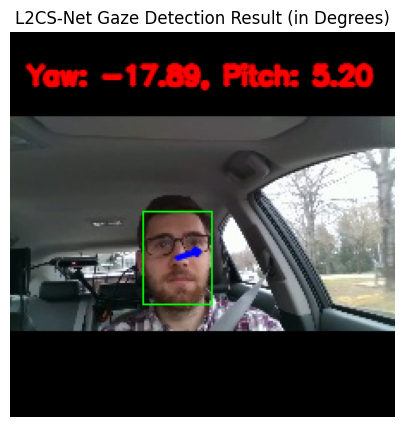

df_12 values [ yaw radian: 0.1294871568679809, pitch radian: 0.0609717406332492 ]
df_12 values [ yaw degree: 7.4190675896837375, pitch degree: 3.4934234078514885 ]
yaw radian: 0.12759311497211456, pitch radian: 0.05758686736226082


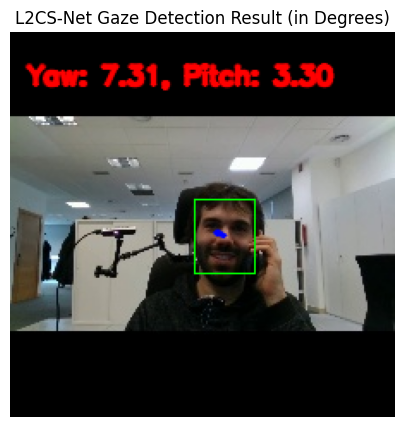

df_12 values [ yaw radian: 0.0040213735774159, pitch radian: -0.0012394351651892 ]
df_12 values [ yaw degree: 0.2304077338313565, pitch degree: -0.07101440394544117 ]
yaw radian: 0.033134784549474716, pitch radian: 0.010909106582403183


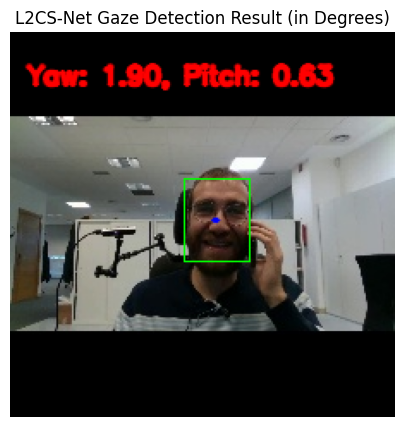

df_12 values [ yaw radian: 0.3006986081600189, pitch radian: 0.1290067285299301 ]
df_12 values [ yaw degree: 17.228761153027182, pitch degree: 7.391541073554941 ]
yaw radian: 0.29322123527526855, pitch radian: 0.1376582682132721


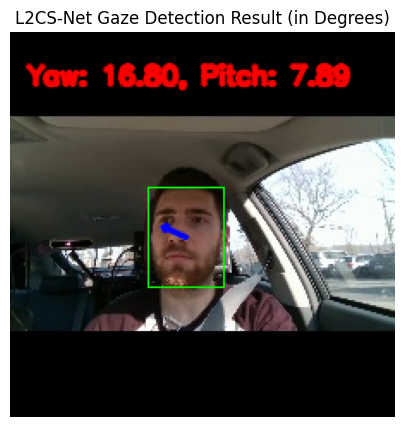

df_12 values [ yaw radian: -0.0722973644733429, pitch radian: 0.2504521906375885 ]
df_12 values [ yaw degree: -4.142333854241605, pitch degree: 14.349853493339731 ]
yaw radian: -0.10143634676933289, pitch radian: 0.21830597519874573


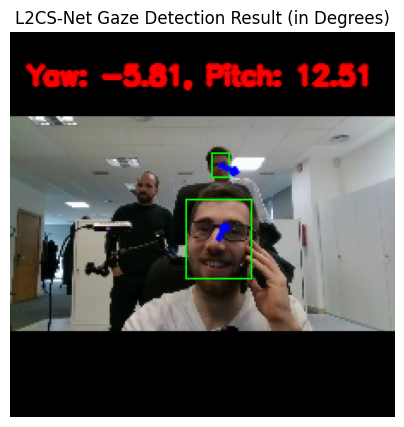

df_12 values [ yaw radian: -0.0957616791129112, pitch radian: 0.1030518189072609 ]
df_12 values [ yaw degree: -5.486740052255901, pitch degree: 5.904434294532509 ]
yaw radian: -0.08633489161729813, pitch radian: 0.08847899734973907


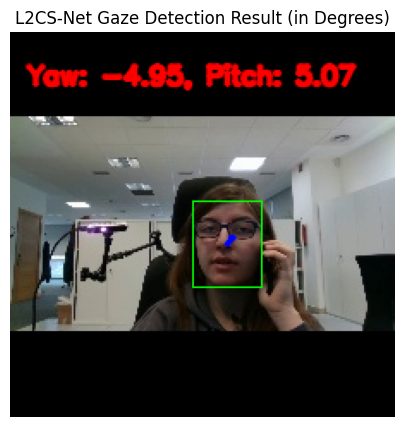

df_12 values [ yaw radian: -0.2156300395727157, pitch radian: 0.0428547896444797 ]
df_12 values [ yaw degree: -12.354691203755534, pitch degree: 2.455398578549633 ]
yaw radian: -0.23064252734184265, pitch radian: 0.07637839764356613


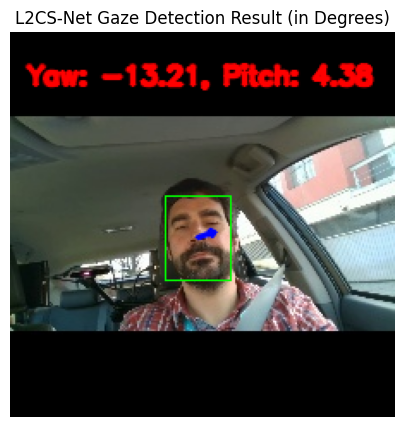

df_12 values [ yaw radian: -0.2223505228757858, pitch radian: 0.0618109069764614 ]
df_12 values [ yaw degree: -12.73974653330959, pitch degree: 3.5415040976269743 ]
yaw radian: -0.2001059353351593, pitch radian: 0.05915413424372673


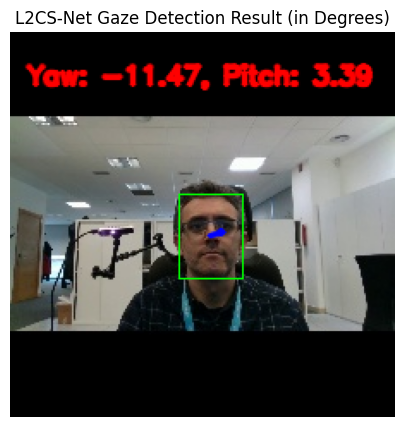

df_12 values [ yaw radian: -0.7736597657203674, pitch radian: -0.1587720811367035 ]
df_12 values [ yaw degree: -44.3274393548571, pitch degree: -9.09697015364178 ]
yaw radian: -0.7853100299835205, pitch radian: -0.14356569945812225


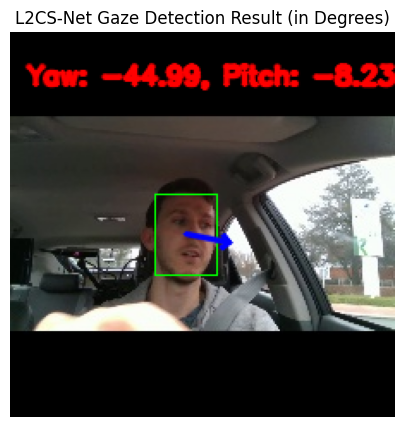

df_12 values [ yaw radian: -0.1478520482778549, pitch radian: 0.2688732743263244 ]
df_12 values [ yaw degree: -8.471298358685576, pitch degree: 15.405303842761581 ]
yaw radian: -0.13650618493556976, pitch radian: 0.2821755111217499


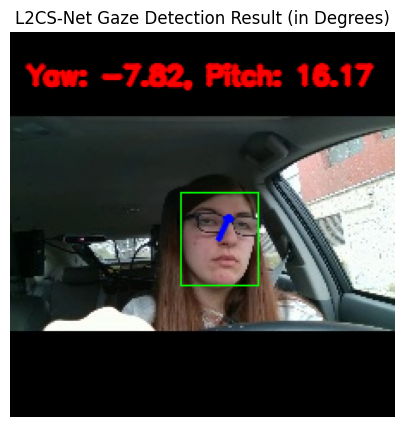

In [ ]:
sample_paths_list = df_12[['frame_path', 'yaw', 'pitch']].sample(n=10, random_state=42)

for _, row in sample_paths_list.iterrows():
  print(f"df_12 values [ yaw radian: {row['yaw']}, pitch radian: {row['pitch']} ]")
  print(f"df_12 values [ yaw degree: {np.degrees(row['yaw'])}, pitch degree: {np.degrees(row['pitch'])} ]")
  apply_l2cs_to_image(row['frame_path'])

# df_12

## 데이터셋 라벨 별 결측치 수

In [ ]:
df_12.groupby(['label', 'dataset'])\
.apply(lambda x: x[['yaw', 'pitch']].isnull().any(axis=1).sum())\
.reset_index(name='프레임 수')

<ipython-input-38-c6a3c7082c1d>:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_12.groupby(['label', 'dataset']).apply(lambda x: x[['yaw', 'pitch']].isnull().any(axis=1).sum()).reset_index(name='프레임 수')


,label,dataset,프레임 수
0,normal,DMD,70
1,normal,yawDD,0
2,phonecall,DMD,6
3,text,DMD,0
4,yawn,DMD,1
5,yawn,yawDD,0


## 그룹별 결측치 수

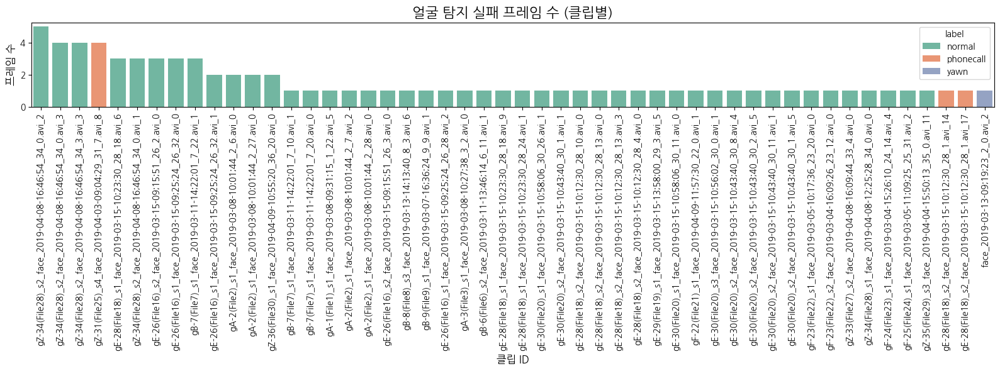

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import koreanize_matplotlib

# 1. 그룹별 yaw 결측값만 계산
missing_summary = (
    df_12.groupby(['label', 'clip_id', 'groups_12'])['yaw']
    .apply(lambda g: g.isna().sum())
    .reset_index(name='missing_yaw')
)

# 2. yaw 결측값이 하나라도 있는 그룹만 필터링
missing_summary = missing_summary[missing_summary['missing_yaw'] > 0]

missing_summary['clip_group'] = missing_summary['clip_id'].astype(str) + '_' + missing_summary['groups_12'].astype(str)

# 3. 결측값 수로 내림차순 정렬
missing_summary = missing_summary.sort_values(by='missing_yaw', ascending=False).reset_index(drop=True)

plt.figure(figsize=(16, 6))
sns.barplot(
    data=missing_summary,
    x='clip_group',
    y='missing_yaw',
    palette='Set2',
    hue='label'
)

plt.title("얼굴 탐지 실패 프레임 수 (클립별)", fontsize=16)
plt.xlabel("클립 ID", fontsize=12)
plt.ylabel("프레임 수", fontsize=12)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

## 그룹별 연속된 결측 프레임 수의 최댓값

In [ ]:
# 1. yaw 결측 플래그 추가
df_12['yaw_missing'] = df_12['yaw'].isna()

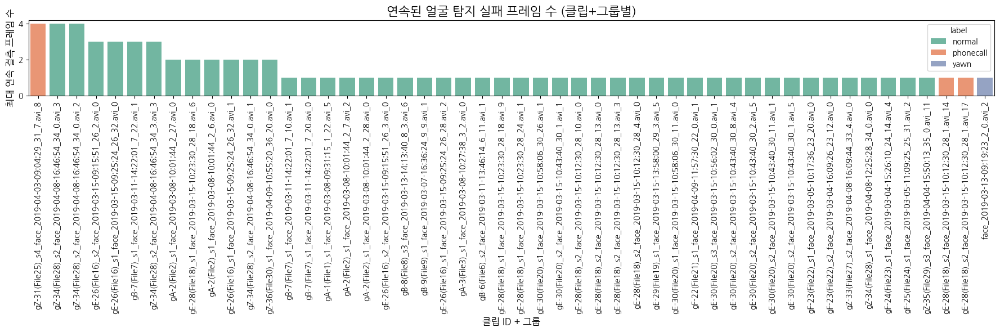

In [ ]:
# 2. 정렬 필수: frame_no 기준
df_12 = df_12.sort_values(by=['label', 'clip_id', 'groups_12', 'frame_no']).reset_index(drop=True)

# 3. 최대 연속 결측 수 계산 함수
def max_consecutive_missing(series):
    max_len = curr_len = 0
    for val in series:
        if val:
            curr_len += 1
            max_len = max(max_len, curr_len)
        else:
            curr_len = 0
    return max_len

# 4. 그룹별 최대 연속 결측 수 계산
consecutive_missing = (
    df_12.groupby(['label', 'clip_id', 'groups_12'])['yaw_missing']
    .apply(max_consecutive_missing)
    .reset_index(name='max_consecutive_missing')
)

# 5. 시각화용 문자열 컬럼 추가
consecutive_missing['clip_group'] = consecutive_missing['clip_id'].astype(str) + '_' + consecutive_missing['groups_12'].astype(str)

# 6. 정렬 + 필터링
consecutive_missing = (
    consecutive_missing[consecutive_missing['max_consecutive_missing'] > 0]
    .sort_values(by='max_consecutive_missing', ascending=False)
    .reset_index(drop=True)
)

# 7. 시각화
plt.figure(figsize=(18, 6))
sns.barplot(
    data=consecutive_missing,
    x='clip_group',
    y='max_consecutive_missing',
    palette='Set2',
    hue='label',
    hue_order = ['normal', 'phonecall', 'yawn']
)

plt.title("연속된 얼굴 탐지 실패 프레임 수 (클립+그룹별)", fontsize=16)
plt.xlabel("클립 ID + 그룹", fontsize=12)
plt.ylabel("최대 연속 결측 프레임 수", fontsize=12)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def show_images(df):
    # 이미지 출력 (3개씩 한 줄에)
    n = len(df)
    cols = 3
    n_rows = (n + cols - 1) // cols  # 올림 나눗셈

    plt.figure(figsize=(15, 5 * n_rows))

    for idx, (_, row) in enumerate(df.iterrows()):
        try:
            img = mpimg.imread(row['frame_path'])
            plt.subplot(n_rows, cols, idx + 1)
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"{row['label']} {row['frame_path'].split('/')[-1]}")
        except Exception as e:
            print(f"Error loading {row['frame_path']}: {e}")

    plt.tight_layout()
    plt.show()

In [ ]:
df_12 = df_12.sort_values(by=['label', 'clip_id', 'groups_12', 'frame_no']).reset_index(drop=True)
show_images(df_12[df_12['yaw_missing'] == True])

Output hidden; open in https://colab.research.google.com to view.

## drop 컬럼 추가

In [20]:
df_12['drop'] = np.where(
    (df_12['clip_id'] == 'gZ-34(File28)_s2_face_2019-04-08-16;46;54_34_0.avi') & ((df_12['groups_12'] == 2) | (df_12['groups_12'] == 3))\
    & (df_12['label'] == 'normal'),
    1,
    np.nan
)

## 선형보간

### 테스트

In [33]:
pd.set_option('display.max_colwidth', None)

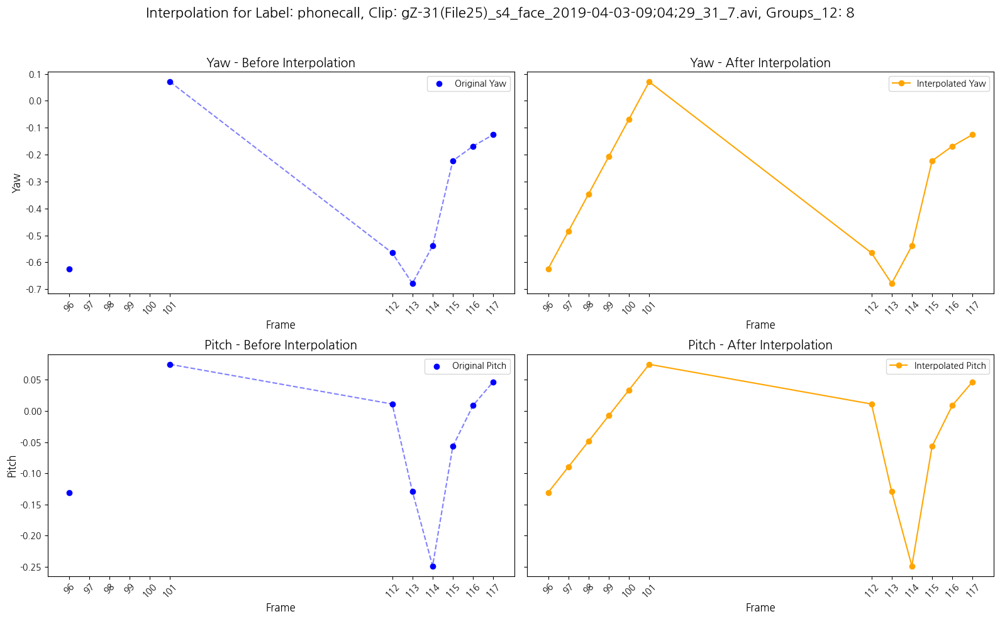

In [39]:
def visualize_interpolation(df, label, clip_id, groups):
    """
    특정 label과 clip_id,에 대해 선형 보간 전후의 yaw와 pitch 데이터를 시각화합니다.

    Args:
        df (pd.DataFrame): 원본 데이터프레임.
        label (str): 대상 라벨.
        clip_id, (str): 대상 비디오 이름.

    Returns:
        None
    """
    # 대상 데이터 필터링
    filtered_df = df[(df['label'] == label) & (df['clip_id'] == clip_id) & (df['groups_12'] == groups)].sort_values(by='frame_no').reset_index(drop=True)

    # 선형 보간 수행
    interpolated_df = filtered_df.copy()
    interpolated_df['pitch'] = interpolated_df['pitch'].interpolate(method='linear', limit_direction='both')
    interpolated_df['yaw'] = interpolated_df['yaw'].interpolate(method='linear', limit_direction='both')

    # 모든 frame 값을 확보
    all_frames = filtered_df['frame_no']

    # 시각화
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))  # 2x2 서브플롯 생성

    # Yaw - Before Interpolation
    axes[0, 0].scatter(filtered_df['frame_no'], filtered_df['yaw'], label='Original Yaw', color='blue')  # 마커만 표시
    axes[0, 0].plot(filtered_df['frame_no'], filtered_df['yaw'], linestyle='--', color='blue', alpha=0.5)  # 선 추가
    axes[0, 0].set_title("Yaw - Before Interpolation", fontsize=14)
    axes[0, 0].set_ylabel("Yaw", fontsize=12)
    axes[0, 0].set_xlabel("Frame", fontsize=12)
    axes[0, 0].set_xticks(all_frames)  # 모든 frame 값을 X축에 표시
    axes[0, 0].tick_params(axis='x', rotation=45)  # X축 레이블 회전
    axes[0, 0].legend(fontsize=10)

    # Yaw - After Interpolation
    axes[0, 1].plot(interpolated_df['frame_no'], interpolated_df['yaw'], 'o-', label='Interpolated Yaw', color='orange')
    axes[0, 1].set_title("Yaw - After Interpolation", fontsize=14)
    axes[0, 1].set_xlabel("Frame", fontsize=12)
    axes[0, 1].set_xticks(all_frames)  # 모든 frame 값을 X축에 표시
    axes[0, 1].tick_params(axis='x', rotation=45)  # X축 레이블 회전
    axes[0, 1].tick_params(axis='y', labelleft=False)  # y축 레이블 숨김
    axes[0, 1].legend(fontsize=10)

    # Pitch - Before Interpolation
    axes[1, 0].scatter(filtered_df['frame_no'], filtered_df['pitch'], label='Original Pitch', color='blue')  # 마커만 표시
    axes[1, 0].plot(filtered_df['frame_no'], filtered_df['pitch'], linestyle='--', color='blue', alpha=0.5)  # 선 추가
    axes[1, 0].set_title("Pitch - Before Interpolation", fontsize=14)
    axes[1, 0].set_ylabel("Pitch", fontsize=12)
    axes[1, 0].set_xlabel("Frame", fontsize=12)
    axes[1, 0].set_xticks(all_frames)  # 모든 frame 값을 X축에 표시
    axes[1, 0].tick_params(axis='x', rotation=45)  # X축 레이블 회전
    axes[1, 0].legend(fontsize=10)

    # Pitch - After Interpolation
    axes[1, 1].plot(interpolated_df['frame_no'], interpolated_df['pitch'], 'o-', label='Interpolated Pitch', color='orange')
    axes[1, 1].set_title("Pitch - After Interpolation", fontsize=14)
    axes[1, 1].set_xlabel("Frame", fontsize=12)
    axes[1, 1].set_xticks(all_frames)  # 모든 frame 값을 X축에 표시
    axes[1, 1].tick_params(axis='x', rotation=45)  # X축 레이블 회전
    axes[1, 1].tick_params(axis='y', labelleft=False)  # y축 레이블 숨김
    axes[1, 1].legend(fontsize=10)

    # 전체 제목 추가 및 레이아웃 조정
    fig.suptitle(f"Interpolation for Label: {label}, Clip: {clip_id}, Groups_12: {groups}", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # 제목과 그래프 간격 조정
    plt.show()

label = "phonecall"
clip_id = "gZ-31(File25)_s4_face_2019-04-03-09;04;29_31_7.avi"
groups = 8
visualize_interpolation(df_12, label, clip_id, groups)

In [59]:
def interpolate(df):
    # 데이터 정렬
    df = df.sort_values(by=['label', 'clip_id', 'groups_12', 'frame_no']).reset_index(drop=True)

    def interpolate_group(group):
        return group.assign(
            pitch=lambda x: x['pitch'].interpolate(method='linear', limit_direction='both'),
            yaw=lambda x: x['yaw'].interpolate(method='linear', limit_direction='both')
        )

    # 3개 컬럼으로 그룹화하여 일괄 처리
    return df.groupby(['label', 'clip_id', 'groups_12'], group_keys=False).apply(interpolate_group)

df_12_interpolated = interpolate(df_12)

<ipython-input-59-396436325763>:12: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby(['label', 'clip_id', 'groups_12'], group_keys=False).apply(interpolate_group)


In [63]:
yaw_pitch_path = '/content/drive/MyDrive/DMS/data/EDA/yaw_pitch_final'
df_12_interpolated.to_csv(os.path.join(yaw_pitch_path, 'final_df_12_yaw_pitch_interpolated.csv'), index=False)

## 추가 drop

In [74]:
paths = df_12_interpolated[
    (df_12_interpolated['label'] == 'text') &
    (df_12_interpolated['clip_id'] == 'gZ-33(File27)_s4_face_2019-04-03-09;22;03_33_0.avi') &
    (df_12_interpolated['groups_12'] == 1)
]

yaw radian: -0.0691274031996727, pitch radian: 0.006621151696890593


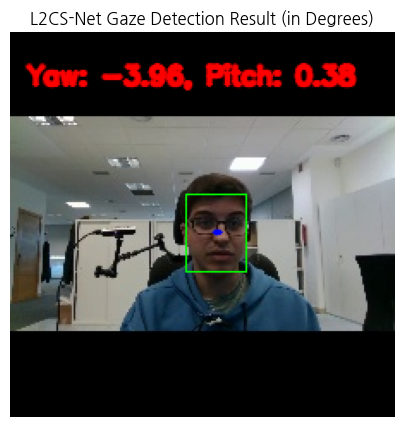

yaw radian: -0.05326056107878685, pitch radian: 0.05504993721842766


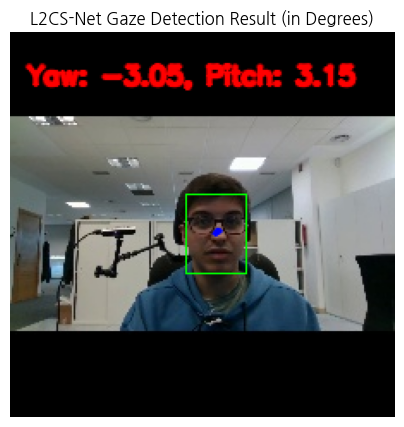

yaw radian: -0.10878347605466843, pitch radian: 0.05421982705593109


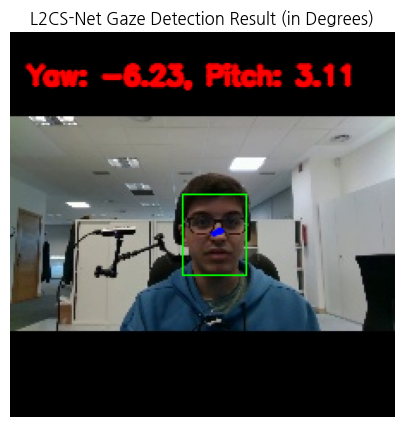

yaw radian: -0.11710585653781891, pitch radian: 0.055326905101537704


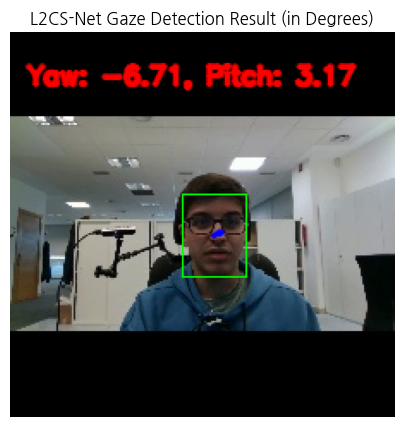

yaw radian: -0.1285228282213211, pitch radian: 0.06082446873188019


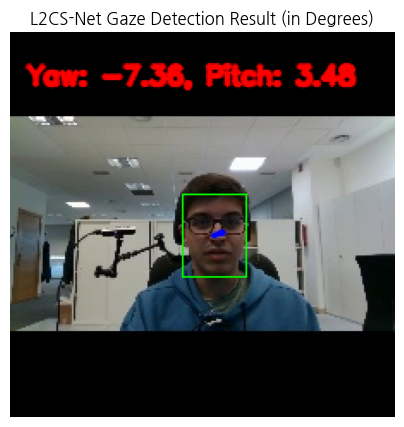

yaw radian: -0.09576887637376785, pitch radian: 0.0652967169880867


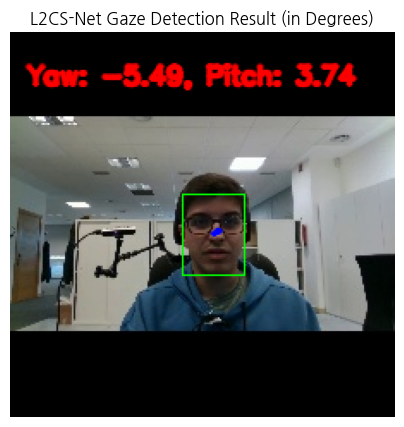

yaw radian: -0.037042174488306046, pitch radian: 0.06929119676351547


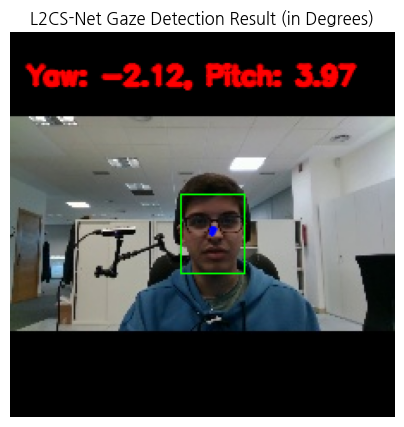

yaw radian: -0.030891072005033493, pitch radian: 0.07308992743492126


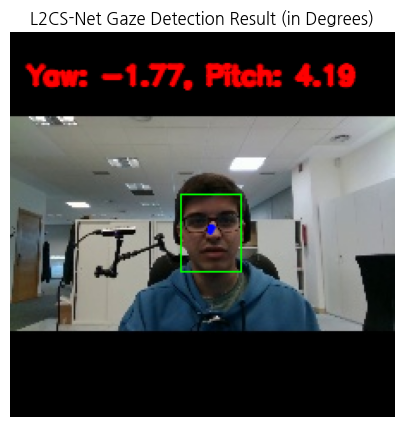

yaw radian: -0.07324225455522537, pitch radian: 0.05337081477046013


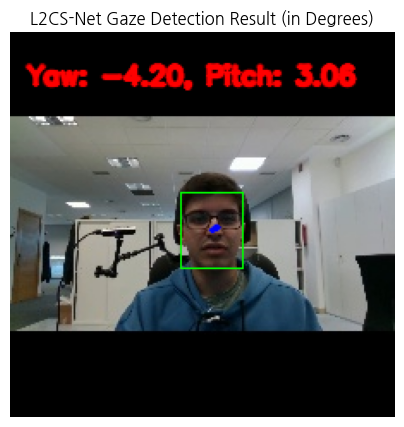

yaw radian: -0.11020906269550323, pitch radian: 0.058154650032520294


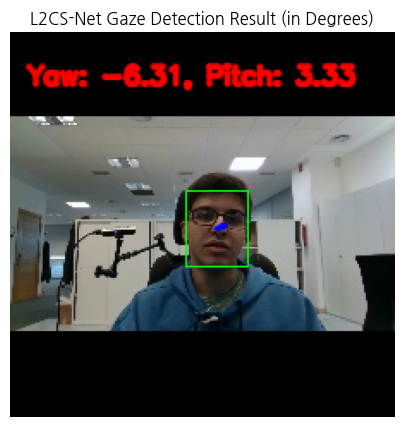

yaw radian: -0.05043920874595642, pitch radian: -0.03093208558857441


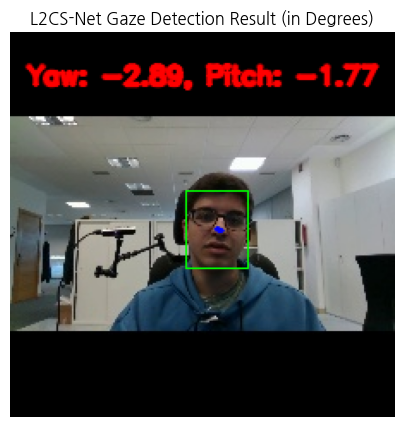

yaw radian: -0.11106421053409576, pitch radian: -0.02877039648592472


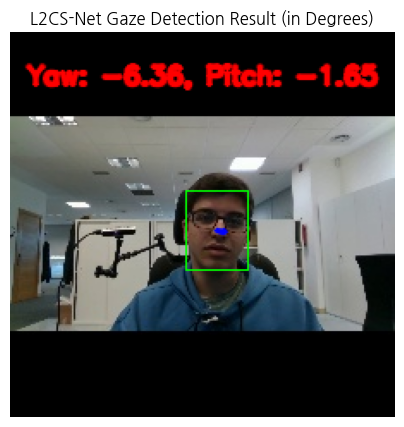

In [75]:
for _, row in paths.iterrows():
  apply_l2cs_to_image(row['frame_path'])

In [77]:
condition = (
    (df_12_interpolated['label'] == 'text') &
    (df_12_interpolated['clip_id'] == 'gZ-33(File27)_s4_face_2019-04-03-09;22;03_33_0.avi') &
    (df_12_interpolated['groups_12'] == 1)
)

df_12_interpolated.loc[condition, 'drop'] = 1

In [84]:
paths = df_12_interpolated[
    (df_12_interpolated['label'] == 'text') &
    (df_12_interpolated['clip_id'] == 'gZ-33(File27)_s2_face_2019-04-08-16;09;44_33_0.avi') &
    (df_12_interpolated['groups_12'].isin([8, 9]))
]
for _, row in paths.iterrows():
  print(row['frame_no'])
  apply_l2cs_to_image(row['frame_path'])

Output hidden; open in https://colab.research.google.com to view.

In [85]:
condition = (
    (df_12_interpolated['label'] == 'text') &
    (df_12_interpolated['clip_id'] == 'gZ-33(File27)_s2_face_2019-04-08-16;09;44_33_0.avi') &
    (df_12_interpolated['groups_12'].isin([8, 9]))
)

df_12_interpolated.loc[condition, 'drop'] = 1

In [86]:
paths = df_12_interpolated[
    (df_12_interpolated['label'] == 'text') &
    (df_12_interpolated['clip_id'] == 'gZ-33(File27)_s2_face_2019-04-08-16;09;44_33_1.avi') &
    (df_12_interpolated['groups_12'].isin([3, 4, 5, 6]))
]
for _, row in paths.iterrows():
  print(row['frame_no'])
  apply_l2cs_to_image(row['frame_path'])

Output hidden; open in https://colab.research.google.com to view.

In [87]:
condition = (
    (df_12_interpolated['label'] == 'text') &
    (df_12_interpolated['clip_id'] == 'gZ-33(File27)_s2_face_2019-04-08-16;09;44_33_1.avi') &
    (df_12_interpolated['groups_12'].isin([3, 4, 5, 6]))
)

df_12_interpolated.loc[condition, 'drop'] = 1

60
yaw radian: 0.01972869783639908, pitch radian: -0.07948550581932068


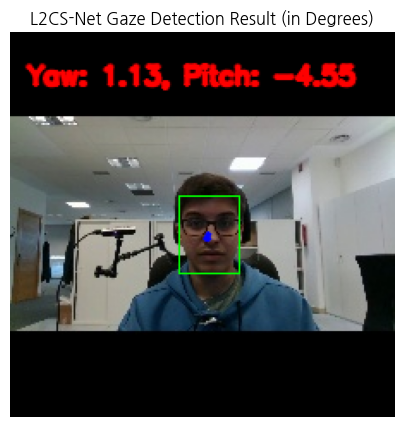

61
yaw radian: -0.009949570521712303, pitch radian: -0.02431119792163372


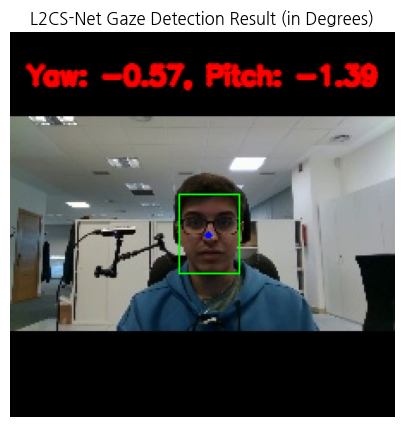

62
yaw radian: -0.03665708005428314, pitch radian: -0.035716455429792404


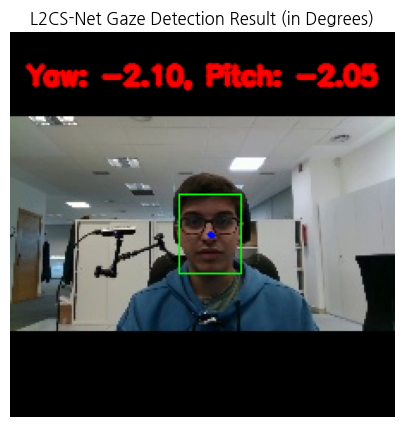

63
yaw radian: -0.0142369931563735, pitch radian: -0.0811060443520546


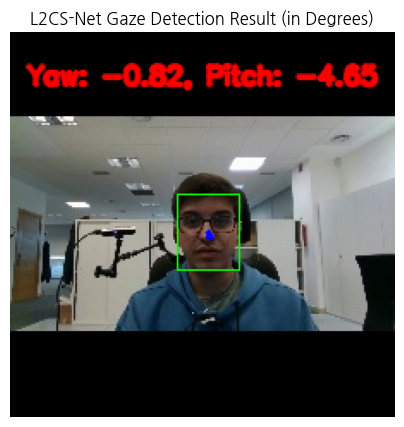

64
yaw radian: 0.3727291226387024, pitch radian: 0.10300309211015701


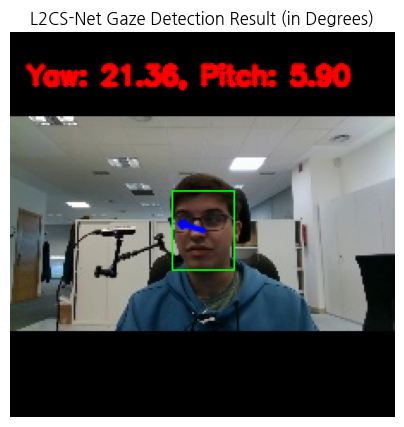

65
yaw radian: 0.46258842945098877, pitch radian: 0.06432919204235077


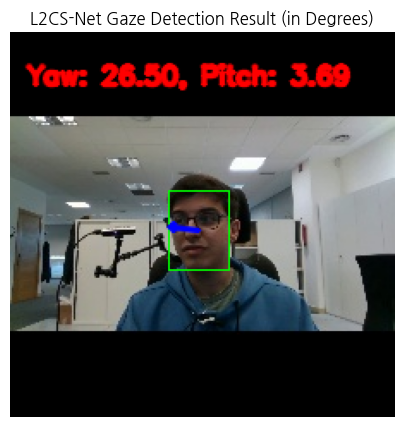

66
yaw radian: 0.2742089331150055, pitch radian: 0.06717637181282043


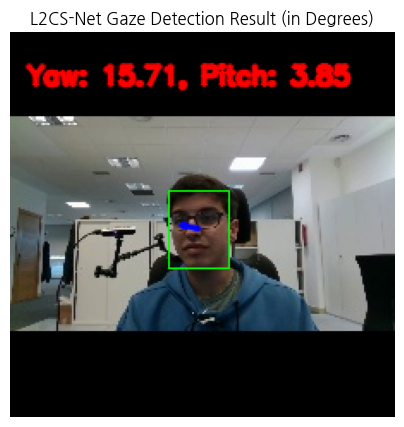

67
yaw radian: 0.020779848098754883, pitch radian: 0.04798377305269241


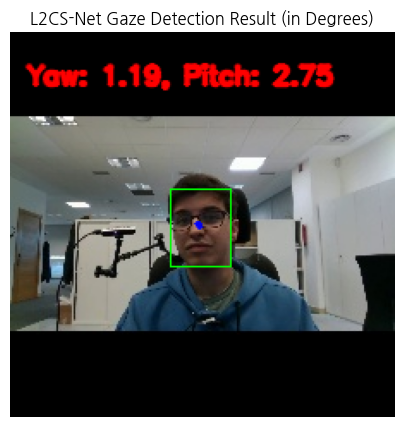

68
yaw radian: -0.1093379408121109, pitch radian: 0.06954658776521683


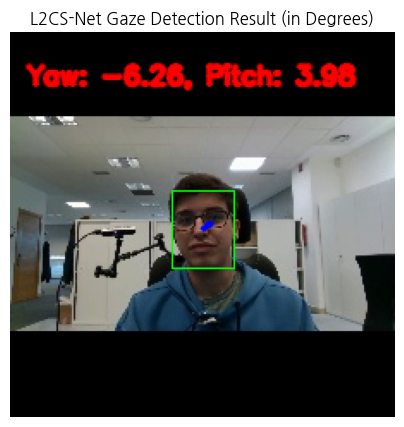

69
yaw radian: -0.12137304246425629, pitch radian: 0.04651397466659546


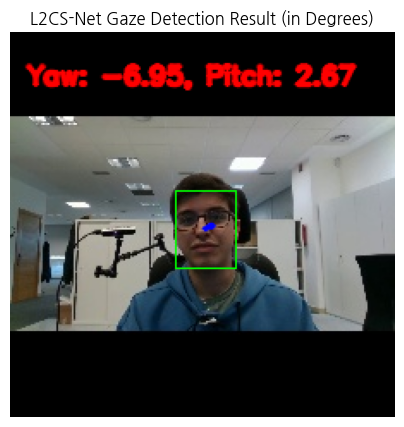

70
yaw radian: -0.07124622166156769, pitch radian: 0.035112716257572174


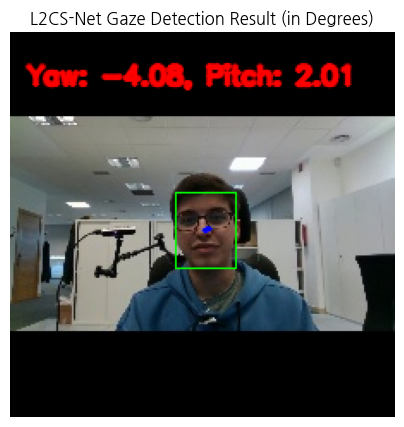

71
yaw radian: 0.017483919858932495, pitch radian: 0.06313475966453552


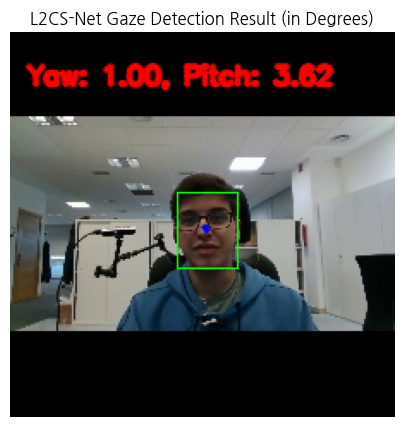

In [88]:
paths = df_12_interpolated[
    (df_12_interpolated['label'] == 'text') &
    (df_12_interpolated['clip_id'] == 'gZ-33(File27)_s4_face_2019-04-03-09;22;03_33_3.avi') &
    (df_12_interpolated['groups_12'] == 5)
]
for _, row in paths.iterrows():
  print(row['frame_no'])
  apply_l2cs_to_image(row['frame_path'])

In [89]:
condition = (
    (df_12_interpolated['label'] == 'text') &
    (df_12_interpolated['clip_id'] == 'gZ-33(File27)_s4_face_2019-04-03-09;22;03_33_3.avi') &
    (df_12_interpolated['groups_12'] == 5)
)

df_12_interpolated.loc[condition, 'drop'] = 1

In [90]:
paths = df_12_interpolated[
    (df_12_interpolated['label'] == 'text') &
    (df_12_interpolated['clip_id'] == 'gF-22(File21)_s2_face_2019-04-09-11;41;13_22_0.avi') &
    (df_12_interpolated['groups_12'] == 0)
]
for _, row in paths.iterrows():
  print(row['frame_no'])
  apply_l2cs_to_image(row['frame_path'])

Output hidden; open in https://colab.research.google.com to view.

In [92]:
condition = (
    (df_12_interpolated['label'] == 'text') &
    (df_12_interpolated['clip_id'] == 'gF-22(File21)_s2_face_2019-04-09-11;41;13_22_0.avi') &
    (df_12_interpolated['groups_12'] == 0)
)

df_12_interpolated.loc[condition, 'drop'] = 1

In [93]:
paths = df_12_interpolated[
    (df_12_interpolated['label'] == 'yawn') &
    (df_12_interpolated['clip_id'] == '39-MaleGlasses-Yawning-clip-3') &
    (df_12_interpolated['groups_12'] == 2)
]
for _, row in paths.iterrows():
  print(row['frame_no'])
  apply_l2cs_to_image(row['frame_path'])

Output hidden; open in https://colab.research.google.com to view.

In [94]:
condition = (
    (df_12_interpolated['label'] == 'yawn') &
    (df_12_interpolated['clip_id'] == '39-MaleGlasses-Yawning-clip-3') &
    (df_12_interpolated['groups_12'] == 2)
)

df_12_interpolated.loc[condition, 'drop'] = 1

In [95]:
df_12_interpolated.to_csv(os.path.join(yaw_pitch_path, 'final_df_12_yaw_pitch_interpolated.csv'), index=False)

# df_24

df_24 values [ yaw radian: -0.1942499130964279, pitch radian: 0.1171721667051315 ]
df_24 values [ yaw degree: -11.129700191208334, pitch degree: 6.7134706286073405 ]
yaw radian: -0.16839300096035004, pitch radian: 0.12353818863630295


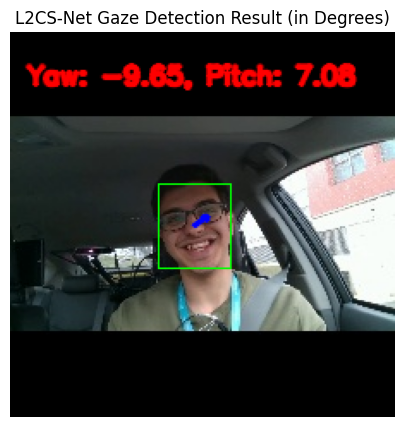

df_24 values [ yaw radian: 0.9345210790634156, pitch radian: -0.2814737856388092 ]
df_24 values [ yaw degree: 53.544113696345235, pitch degree: -16.12725996067381 ]
yaw radian: 0.9338182806968689, pitch radian: -0.28730982542037964


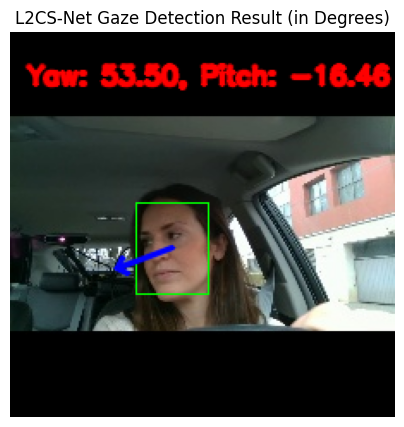

df_24 values [ yaw radian: -0.2350889593362808, pitch radian: 0.0577407926321029 ]
df_24 values [ yaw degree: -13.46960518009152, pitch degree: 3.308303723559576 ]
yaw radian: -0.24387499690055847, pitch radian: 0.06762751191854477


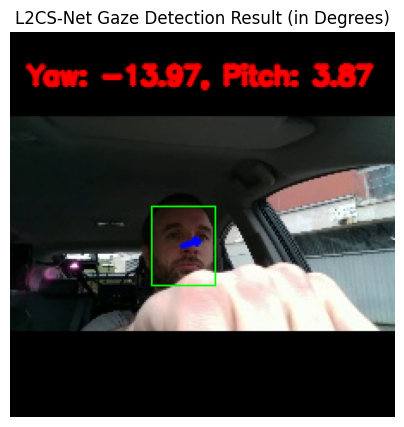

df_24 values [ yaw radian: -0.0039049934, pitch radian: 0.06529592 ]
df_24 values [ yaw degree: -0.22373964084644168, pitch degree: 3.741180635423862 ]
yaw radian: -0.0014484933344647288, pitch radian: 0.06774202734231949


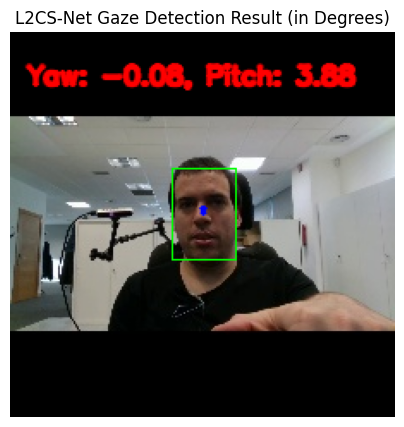

df_24 values [ yaw radian: -0.245718702673912, pitch radian: 0.0965875312685966 ]
df_24 values [ yaw degree: -14.078644610645094, pitch degree: 5.534057895278455 ]
yaw radian: -0.24803856015205383, pitch radian: 0.11347250640392303


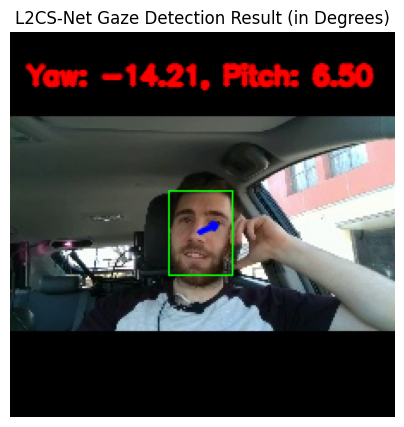

df_24 values [ yaw radian: -0.0695985183119773, pitch radian: 0.0858496576547622 ]
df_24 values [ yaw degree: -3.987701359640274, pitch degree: 4.918823056260855 ]
yaw radian: -0.07601913809776306, pitch radian: 0.08592263609170914


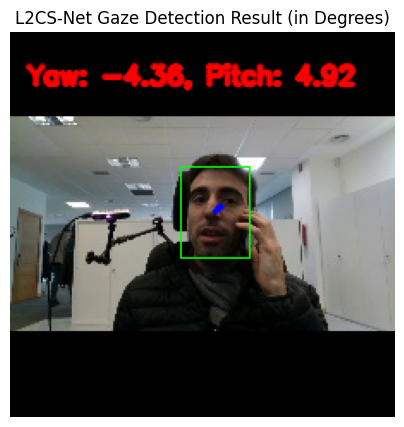

df_24 values [ yaw radian: -0.1338347643613815, pitch radian: 0.3122103810310364 ]
df_24 values [ yaw degree: -7.668167150035043, pitch degree: 17.88833715324968 ]
yaw radian: -0.1401030570268631, pitch radian: 0.3036973178386688


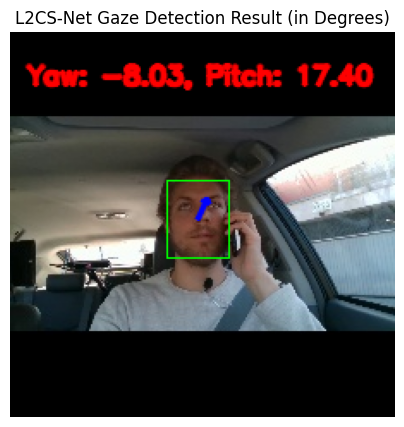

df_24 values [ yaw radian: 0.025018535554409, pitch radian: 0.0635970830917358 ]
df_24 values [ yaw degree: 1.433456496865629, pitch degree: 3.64384445049927 ]
yaw radian: 0.15500584244728088, pitch radian: 0.079190693795681


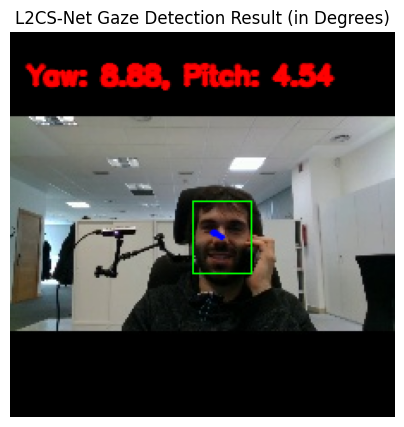

df_24 values [ yaw radian: -0.1313308626413345, pitch radian: 0.1053506657481193 ]
df_24 values [ yaw degree: -7.524704149160802, pitch degree: 6.036148516260678 ]
yaw radian: -0.12974813580513, pitch radian: 0.10498473793268204


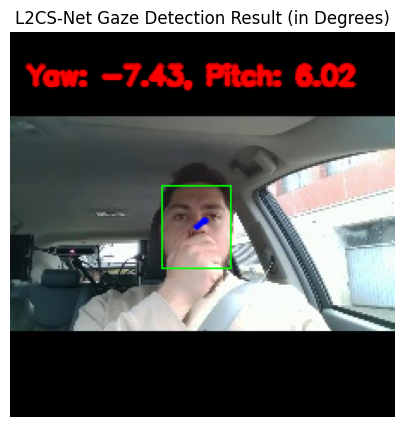

df_24 values [ yaw radian: -0.1754176318645477, pitch radian: 0.0492248050868511 ]
df_24 values [ yaw degree: -10.05068995801817, pitch degree: 2.8203735788306736 ]
yaw radian: -0.18035246431827545, pitch radian: 0.06090356409549713


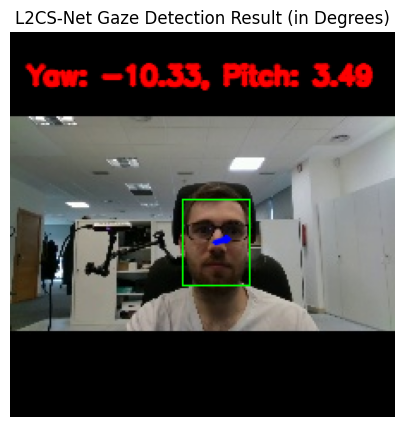

In [ ]:
sample_paths_list = df_24[['frame_path', 'yaw', 'pitch']].sample(n=10, random_state=42)

for _, row in sample_paths_list.iterrows():
  print(f"df_24 values [ yaw radian: {row['yaw']}, pitch radian: {row['pitch']} ]")
  print(f"df_24 values [ yaw degree: {np.degrees(row['yaw'])}, pitch degree: {np.degrees(row['pitch'])} ]")
  apply_l2cs_to_image(row['frame_path'])

## 데이터셋 라벨 별 결측 프레임 수

In [ ]:
df_24.groupby(['label', 'dataset'])\
.apply(lambda x: x[['yaw', 'pitch']].isnull().any(axis=1).sum())\
.reset_index(name='프레임 수')

<ipython-input-37-c96ab8e77f8a>:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x[['yaw', 'pitch']].isnull().any(axis=1).sum())\


,label,dataset,프레임 수
0,normal,DMD,59
1,normal,yawDD,0
2,phonecall,DMD,6
3,text,DMD,0
4,yawn,DMD,0
5,yawn,yawDD,0


## 그룹별 결측 프레임 수

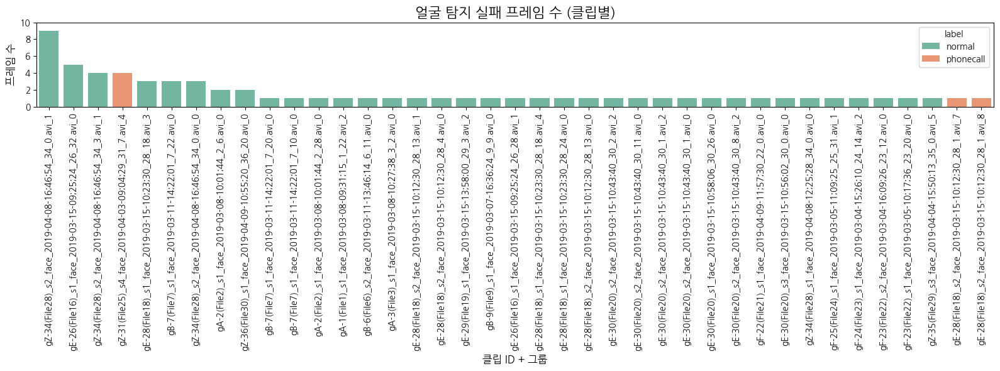

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
import koreanize_matplotlib

# 1. 그룹별 yaw 결측값만 계산
missing_summary = (
    df_24.groupby(['label', 'clip_id', 'groups_24'])['yaw']
    .apply(lambda g: g.isna().sum())
    .reset_index(name='missing_yaw')
)

# 2. yaw 결측값이 하나라도 있는 그룹만 필터링
missing_summary = missing_summary[missing_summary['missing_yaw'] > 0]

missing_summary['clip_group'] = missing_summary['clip_id'].astype(str) + '_' + missing_summary['groups_24'].astype(str)

# 3. 결측값 수로 내림차순 정렬
missing_summary = missing_summary.sort_values(by='missing_yaw', ascending=False).reset_index(drop=True)

plt.figure(figsize=(16, 6))
sns.barplot(
    data=missing_summary,
    x='clip_group',
    y='missing_yaw',
    palette='Set2',
    hue='label',
)

plt.title("얼굴 탐지 실패 프레임 수 (클립별)", fontsize=16)
plt.xlabel("클립 ID + 그룹", fontsize=12)
plt.ylabel("프레임 수", fontsize=12)
plt.xticks(rotation=90)
plt.yticks([0, 2, 4, 6, 8, 10])
plt.tight_layout()
plt.show()

In [10]:
missing_summary[missing_summary['missing_yaw'] == 9]['clip_id'].values

array(['gZ-34(File28)_s2_face_2019-04-08-16;46;54_34_0.avi'], dtype=object)

In [12]:
df_24[df_24['clip_id'] == 'gZ-34(File28)_s2_face_2019-04-08-16;46;54_34_0.avi']['groups_24'].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

In [16]:
import numpy as np

df_24['drop'] = np.where(
    (df_24['clip_id'] == 'gZ-34(File28)_s2_face_2019-04-08-16;46;54_34_0.avi') & (df_24['groups_24'] == 1)\
    & (df_24['label'] == 'normal'),
    1,
    np.nan
)

In [17]:
len(df_24)

121488

In [18]:
len(df_24[~df_24['drop'].isna()])

24

## 그룹별 연속된 결측 프레임 수의 최댓값

In [ ]:
# 1. yaw 결측 플래그 추가
df_24['yaw_missing'] = df_24['yaw'].isna()

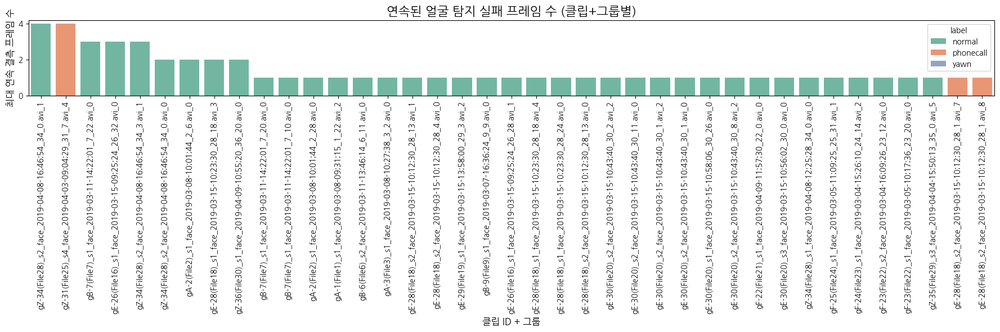

In [ ]:
# 2. 정렬 필수: frame_no 기준
df_24 = df_24.sort_values(by=['label', 'clip_id', 'groups_24', 'frame_no']).reset_index(drop=True)

# 3. 최대 연속 결측 수 계산 함수
def max_consecutive_missing(series):
    max_len = curr_len = 0
    for val in series:
        if val:
            curr_len += 1
            max_len = max(max_len, curr_len)
        else:
            curr_len = 0
    return max_len

# 4. 그룹별 최대 연속 결측 수 계산
consecutive_missing = (
    df_24.groupby(['label', 'clip_id', 'groups_24'])['yaw_missing']
    .apply(max_consecutive_missing)
    .reset_index(name='max_consecutive_missing')
)

# 5. 시각화용 문자열 컬럼 추가
consecutive_missing['clip_group'] = consecutive_missing['clip_id'].astype(str) + '_' + consecutive_missing['groups_24'].astype(str)

# 6. 정렬 + 필터링
consecutive_missing = (
    consecutive_missing[consecutive_missing['max_consecutive_missing'] > 0]
    .sort_values(by='max_consecutive_missing', ascending=False)
    .reset_index(drop=True)
)

# 7. 시각화
plt.figure(figsize=(18, 6))
sns.barplot(
    data=consecutive_missing,
    x='clip_group',
    y='max_consecutive_missing',
    palette='Set2',
    hue='label',
    hue_order = ['normal', 'phonecall', 'yawn']
)

plt.title("연속된 얼굴 탐지 실패 프레임 수 (클립+그룹별)", fontsize=16)
plt.xlabel("클립 ID + 그룹", fontsize=12)
plt.ylabel("최대 연속 결측 프레임 수", fontsize=12)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

## 선형보간

### 테스트

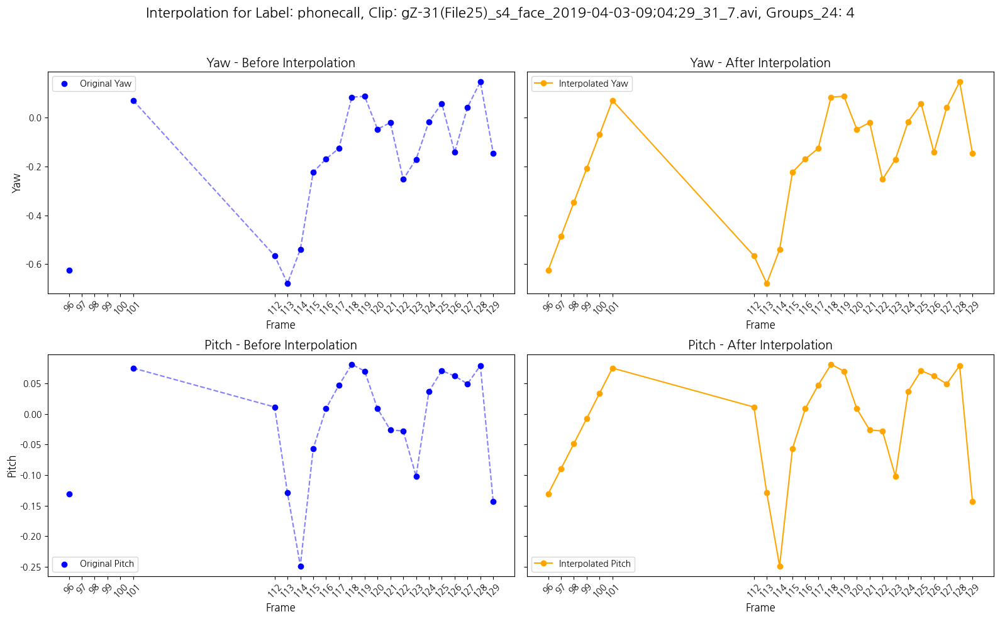

In [65]:
def visualize_interpolation(df, label, clip_id, groups):
    # 대상 데이터 필터링
    filtered_df = df[(df['label'] == label) & (df['clip_id'] == clip_id) & (df['groups_24'] == groups)].sort_values(by='frame_no').reset_index(drop=True)

    # 선형 보간 수행
    interpolated_df = filtered_df.copy()
    interpolated_df['pitch'] = interpolated_df['pitch'].interpolate(method='linear', limit_direction='both')
    interpolated_df['yaw'] = interpolated_df['yaw'].interpolate(method='linear', limit_direction='both')

    # 모든 frame 값을 확보
    all_frames = filtered_df['frame_no']

    # 시각화
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))  # 2x2 서브플롯 생성

    # Yaw - Before Interpolation
    axes[0, 0].scatter(filtered_df['frame_no'], filtered_df['yaw'], label='Original Yaw', color='blue')  # 마커만 표시
    axes[0, 0].plot(filtered_df['frame_no'], filtered_df['yaw'], linestyle='--', color='blue', alpha=0.5)  # 선 추가
    axes[0, 0].set_title("Yaw - Before Interpolation", fontsize=14)
    axes[0, 0].set_ylabel("Yaw", fontsize=12)
    axes[0, 0].set_xlabel("Frame", fontsize=12)
    axes[0, 0].set_xticks(all_frames)  # 모든 frame 값을 X축에 표시
    axes[0, 0].tick_params(axis='x', rotation=45)  # X축 레이블 회전
    axes[0, 0].legend(fontsize=10)

    # Yaw - After Interpolation
    axes[0, 1].plot(interpolated_df['frame_no'], interpolated_df['yaw'], 'o-', label='Interpolated Yaw', color='orange')
    axes[0, 1].set_title("Yaw - After Interpolation", fontsize=14)
    axes[0, 1].set_xlabel("Frame", fontsize=12)
    axes[0, 1].set_xticks(all_frames)  # 모든 frame 값을 X축에 표시
    axes[0, 1].tick_params(axis='x', rotation=45)  # X축 레이블 회전
    axes[0, 1].tick_params(axis='y', labelleft=False)  # y축 레이블 숨김
    axes[0, 1].legend(fontsize=10)

    # Pitch - Before Interpolation
    axes[1, 0].scatter(filtered_df['frame_no'], filtered_df['pitch'], label='Original Pitch', color='blue')  # 마커만 표시
    axes[1, 0].plot(filtered_df['frame_no'], filtered_df['pitch'], linestyle='--', color='blue', alpha=0.5)  # 선 추가
    axes[1, 0].set_title("Pitch - Before Interpolation", fontsize=14)
    axes[1, 0].set_ylabel("Pitch", fontsize=12)
    axes[1, 0].set_xlabel("Frame", fontsize=12)
    axes[1, 0].set_xticks(all_frames)  # 모든 frame 값을 X축에 표시
    axes[1, 0].tick_params(axis='x', rotation=45)  # X축 레이블 회전
    axes[1, 0].legend(fontsize=10)

    # Pitch - After Interpolation
    axes[1, 1].plot(interpolated_df['frame_no'], interpolated_df['pitch'], 'o-', label='Interpolated Pitch', color='orange')
    axes[1, 1].set_title("Pitch - After Interpolation", fontsize=14)
    axes[1, 1].set_xlabel("Frame", fontsize=12)
    axes[1, 1].set_xticks(all_frames)  # 모든 frame 값을 X축에 표시
    axes[1, 1].tick_params(axis='x', rotation=45)  # X축 레이블 회전
    axes[1, 1].tick_params(axis='y', labelleft=False)  # y축 레이블 숨김
    axes[1, 1].legend(fontsize=10)

    # 전체 제목 추가 및 레이아웃 조정
    fig.suptitle(f"Interpolation for Label: {label}, Clip: {clip_id}, Groups_24: {groups}", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # 제목과 그래프 간격 조정
    plt.show()

label = "phonecall"
clip_id = "gZ-31(File25)_s4_face_2019-04-03-09;04;29_31_7.avi"
groups = 4
visualize_interpolation(df_24, label, clip_id, groups)

In [66]:
def interpolate(df):
    # 데이터 정렬
    df = df.sort_values(by=['label', 'clip_id', 'groups_24', 'frame_no']).reset_index(drop=True)

    def interpolate_group(group):
        return group.assign(
            pitch=lambda x: x['pitch'].interpolate(method='linear', limit_direction='both'),
            yaw=lambda x: x['yaw'].interpolate(method='linear', limit_direction='both')
        )

    # 3개 컬럼으로 그룹화하여 일괄 처리
    return df.groupby(['label', 'clip_id', 'groups_24'], group_keys=False).apply(interpolate_group)

df_24_interpolated = interpolate(df_24)

<ipython-input-66-0a3e6df38a58>:12: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby(['label', 'clip_id', 'groups_24'], group_keys=False).apply(interpolate_group)


In [71]:
df_24_interpolated.to_csv(os.path.join(yaw_pitch_path, 'final_df_24_yaw_pitch_interpolated.csv'), index=False)

## 추가 drop

In [96]:
paths = df_24_interpolated[
    (df_24_interpolated['label'] == 'text') &
    (df_24_interpolated['clip_id'] == 'gZ-33(File27)_s2_face_2019-04-08-16;09;44_33_0.avi') &
    (df_24_interpolated['groups_24'].isin([4]))
]
for _, row in paths.iterrows():
  print(row['frame_no'])

96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119


In [97]:
condition = (
    (df_24_interpolated['label'] == 'text') &
    (df_24_interpolated['clip_id'] == 'gZ-33(File27)_s2_face_2019-04-08-16;09;44_33_0.avi') &
    (df_24_interpolated['groups_24'].isin([4]))
)

df_24_interpolated.loc[condition, 'drop'] = 1

In [98]:
paths = df_24_interpolated[
    (df_24_interpolated['label'] == 'text') &
    (df_24_interpolated['clip_id'] == 'gZ-33(File27)_s2_face_2019-04-08-16;09;44_33_1.avi') &
    (df_24_interpolated['groups_24'].isin([2]))
]
for _, row in paths.iterrows():
  print(row['frame_no'])

48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71


In [100]:
df_24_interpolated.to_csv(os.path.join(yaw_pitch_path, 'final_df_24_yaw_pitch_interpolated.csv'), index=False)

In [99]:
condition = (
    (df_24_interpolated['label'] == 'text') &
    (df_24_interpolated['clip_id'] == 'gZ-33(File27)_s2_face_2019-04-08-16;09;44_33_1.avi') &
    (df_24_interpolated['groups_24'].isin([2]))
)

df_24_interpolated.loc[condition, 'drop'] = 1

# 시각화

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
sns.set_theme(style="whitegrid")
color_palette = sns.color_palette("Set2")

In [ ]:
df = merged_df.copy()

In [ ]:
df.columns

Index(['label', 'video_name', 'frame', 'pitch', 'yaw', 'bbox', 'landmarks',
       'score', 'dataset'],
      dtype='object')

In [ ]:
df['video_name'].str.split("_").str[0].str.startswith(prefix)

In [ ]:
df[df['dataset']=='yawDD']['video_name']

,video_name
0,dash9-MaleNoGlasses-clip-0_part1
1,dash9-MaleNoGlasses-clip-0_part1
2,dash9-MaleNoGlasses-clip-0_part1
3,dash9-MaleNoGlasses-clip-0_part1
4,dash9-MaleNoGlasses-clip-0_part1
...,...
128503,mirror4-FemaleGlasses-Yawning-clip-2_part2
128504,mirror4-FemaleGlasses-Yawning-clip-2_part2
128505,mirror4-FemaleGlasses-Yawning-clip-2_part2
128506,mirror4-FemaleGlasses-Yawning-clip-2_part2


In [ ]:
df['camera'] = df['video_name'].map(
    lambda key: "mirror" if key.startswith('mirror')
    else "dash" if key.startswith('dash')
    else np.nan
)

In [ ]:
df['group'] = df.apply(
    lambda row: f"{row['label']}({row['dataset']})" if pd.isna(row['camera'])
    else f"{row['label']}({row['dataset']}/{row['camera']})",
    axis=1
)

In [ ]:
df['group'].unique()

array(['yawn(yawDD/dash)', 'yawn(yawDD/mirror)', 'normal(yawDD/mirror)',
       'text(DMD/)', 'normal(DMD/)', 'phonecall(DMD/)'], dtype=object)

In [ ]:
group_order = [
    'phonecall(DMD)',
    'text(DMD)',
    'normal(DMD)',
    'normal(yawDD/mirror)',
    'yawn(yawDD/mirror)',
    'yawn(yawDD/dash)',
]

In [ ]:
group_palette = {
  'normal(DMD)': (0.4, 0.7607843137254902, 0.6470588235294118),
 'normal(yawDD/mirror)': (0.9882352941176471,
  0.5529411764705883,
  0.3843137254901961),
 'yawn(yawDD/mirror)': (0.9058823529411765,
  0.5411764705882353,
  0.7647058823529411),
 'yawn(yawDD/dash)': (0.6509803921568628,
  0.8470588235294118,
  0.32941176470588235),
 'phonecall(DMD)': (1.0, 0.8509803921568627, 0.1843137254901961),
 'text(DMD)': (0.8980392156862745, 0.7686274509803922, 0.5803921568627451)
}

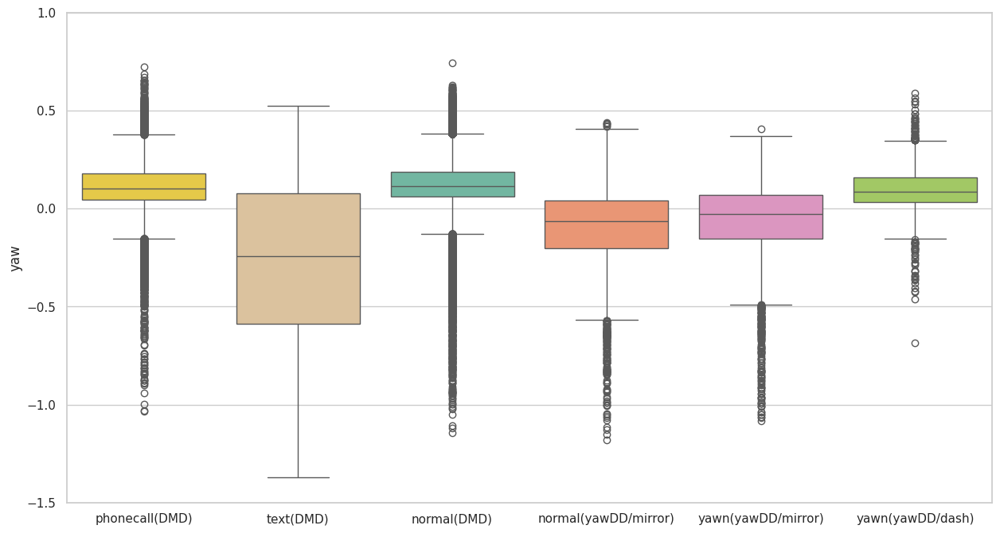

In [ ]:
plt.figure(figsize=(15, 8))
sns.boxplot(
    data=df,
    x='group',
    y='yaw',
    order=group_order,
    hue='group',
    palette=group_palette
)
plt.xlabel(None)

# y축 눈금 고정
plt.yticks([-1.5, -1, -0.5, 0, 0.5, 1])

plt.show()

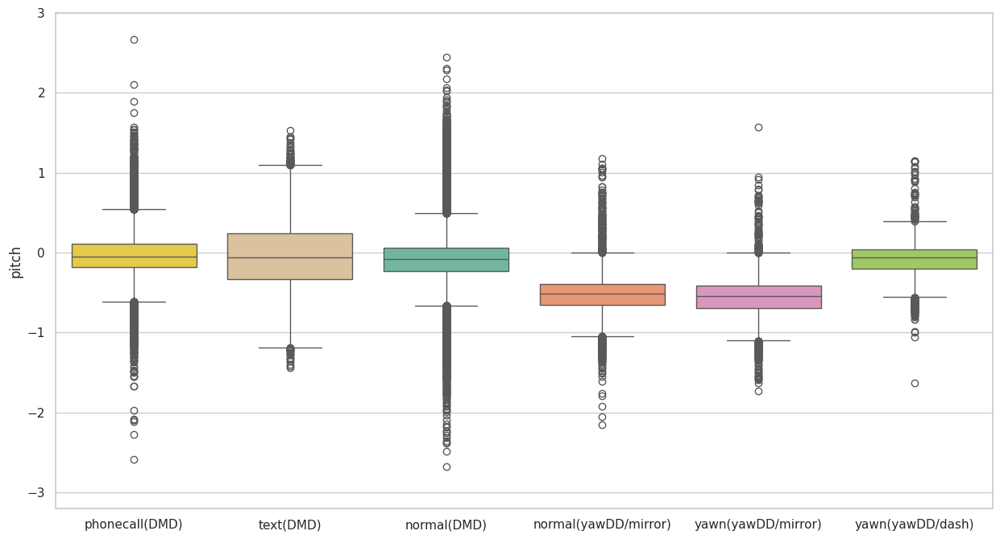

In [ ]:
plt.figure(figsize=(15, 8))
sns.boxplot(
    data=df,
    x='group',
    y='pitch',
    order=group_order,
    hue='group',
    palette=group_palette
)
plt.xlabel(None)

# y축 범위 지정
plt.ylim(-3.2, 3)

# y축 눈금: -3, -2, -1, 0, 1, 2, 3 (정수만, 1 간격)
plt.yticks(np.arange(-3, 4, 1))

plt.show()

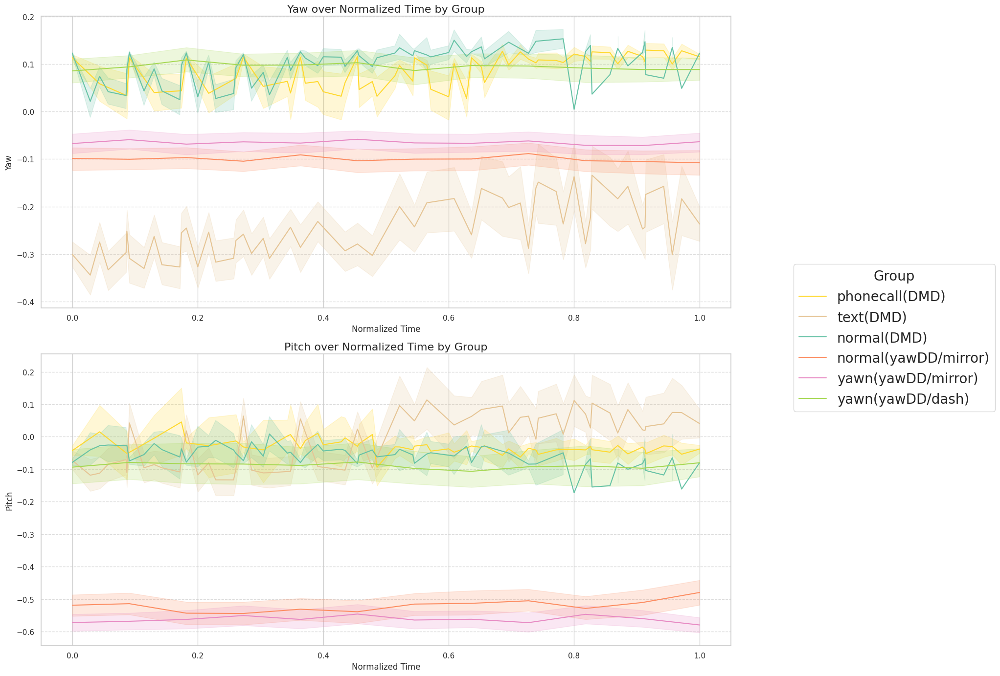

In [ ]:
def plot_groupwise_time_series(df):
    # 1. 클립 내 프레임 번호를 정규화
    df['frame_idx_normalized'] = df.groupby('video_name').cumcount()
    df['total_frames'] = df.groupby('video_name')['frame_idx_normalized'].transform('max') + 1
    df['time_normalized'] = df['frame_idx_normalized'] / (df['total_frames'] - 1)

    # 2. 시간 구간 나누기
    time_bins = np.linspace(0, 1, 21)  # 0.0, 0.05, ..., 1.0
    df['time_bin'] = pd.cut(df['time_normalized'], bins=time_bins, labels=time_bins[:-1])

    # 3. 그대로 시각화 (평균 없이 데이터 다 사용)
    fig, axes = plt.subplots(2, 1, figsize=(16, 14))  # fig, axes를 따로 받자

    # 3-1. Yaw plot
    sns.lineplot(
        data=df,
        x='time_normalized',
        y='yaw',
        hue='group',
        palette=group_palette,
        hue_order=group_order,
        errorbar='ci',
        ax=axes[0]
    )
    axes[0].set_title("Yaw over Normalized Time by Group", fontsize=16)
    axes[0].set_xlabel("Normalized Time", fontsize=12)
    axes[0].set_ylabel("Yaw", fontsize=12)
    axes[0].grid(axis='y', linestyle='--', alpha=0.7)

    # 3-2. Pitch plot
    sns.lineplot(
        data=df,
        x='time_normalized',
        y='pitch',
        hue='group',
        palette=group_palette,
        hue_order=group_order,
        errorbar='ci',
        ax=axes[1]
    )
    axes[1].set_title("Pitch over Normalized Time by Group", fontsize=16)
    axes[1].set_xlabel("Normalized Time", fontsize=12)
    axes[1].set_ylabel("Pitch", fontsize=12)
    axes[1].grid(axis='y', linestyle='--', alpha=0.7)

    # 4. 범례를 오른쪽 바깥으로 빼기
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles, labels,
        loc='center left',
        bbox_to_anchor=(1.01, 0.5),
        title="Group",
        fontsize=20,
        title_fontsize=20
    )

    # 각 axes 내부 범례 제거
    axes[0].legend().remove()
    axes[1].legend().remove()

    plt.tight_layout(rect=[0, 0, 0.95, 1])  # 그래프 영역을 왼쪽 85%로 좁힘
    plt.show()

# 실행
plot_groupwise_time_series(df)

## 시간 흐름별 yaw, pitch 절댓값 추이

In [ ]:
# 그룹별로 처리
grouped = df.groupby(['group', 'video_name'])

new_group_list = []  # 결과 저장용 리스트

for _, group in grouped:
    group = group.sort_values('frame')  # 1. 시간순 정렬
    group['time'] = np.arange(1, len(group) + 1)  # 2. 1부터 순서대로 time 컬럼 부여
    new_group_list.append(group)  # 3. 리스트에 저장

# 그룹별로 가공한 결과를 다시 합치기
time_12_df = pd.concat(new_group_list, ignore_index=True)

In [ ]:
time_12_df['abs_yaw'] = time_12_df['yaw'].abs()
time_12_df['abs_pitch'] = time_12_df['pitch'].abs()

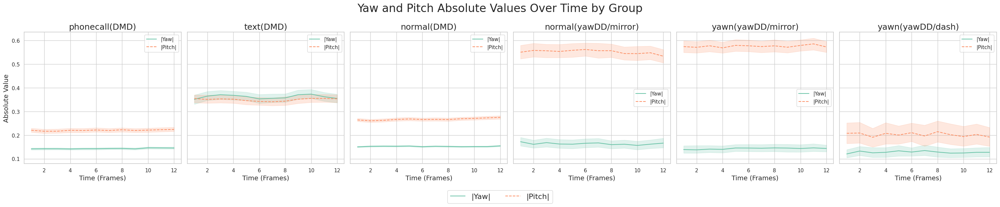

In [ ]:
groups = group_order  # 미리 정해둔 group 순서 사용

# 2. 1행 6열 플롯
fig, axes = plt.subplots(1, len(groups), figsize=(30, 6), sharey=True)

# 범례 핸들 및 라벨 저장
all_handles = []
all_labels = []

for i, group in enumerate(groups):
    # group별 데이터 필터링
    subset = time_12_df[time_12_df['group'] == group]

    if subset.empty:
        axes[i].text(0.5, 0.5, 'No Data Available', ha='center', va='center', fontsize=12, color='gray')
        axes[i].set_visible(True)
        axes[i].set_title(group, fontsize=18)
        continue

    # yaw (abs_yaw)
    sns.lineplot(
        data=subset,
        x='time',
        y='abs_yaw',
        ax=axes[i],
        color=color_palette[0],
        linestyle='solid',
        label="|Yaw|",
        errorbar='ci'
    )

    # pitch (abs_pitch)
    sns.lineplot(
        data=subset,
        x='time',
        y='abs_pitch',
        ax=axes[i],
        color=color_palette[1],
        linestyle='dashed',
        label="|Pitch|",
        errorbar='ci'
    )

    # 첫 번째 플롯에서만 핸들 수집
    handles, labels = axes[i].get_legend_handles_labels()
    if i == 0:
        all_handles.extend(handles)
        all_labels.extend(labels)

    # 제목/축 설정
    axes[i].set_title(group, fontsize=18)
    axes[i].set_xlabel("Time (Frames)", fontsize=14)
    if i == 0:
        axes[i].set_ylabel("Absolute Value", fontsize=14)

# 전체 범례 추가 (하단 중앙)
fig.legend(
    handles=all_handles,
    labels=all_labels,
    loc='lower center',
    ncol=2,
    fontsize=16,
    frameon=True,
)

# 레이아웃 및 전체 제목
plt.tight_layout(rect=[0, 0.1, 1, 0.95])
plt.suptitle("Yaw and Pitch Absolute Values Over Time by Group", fontsize=24, y=1.02)
plt.show()

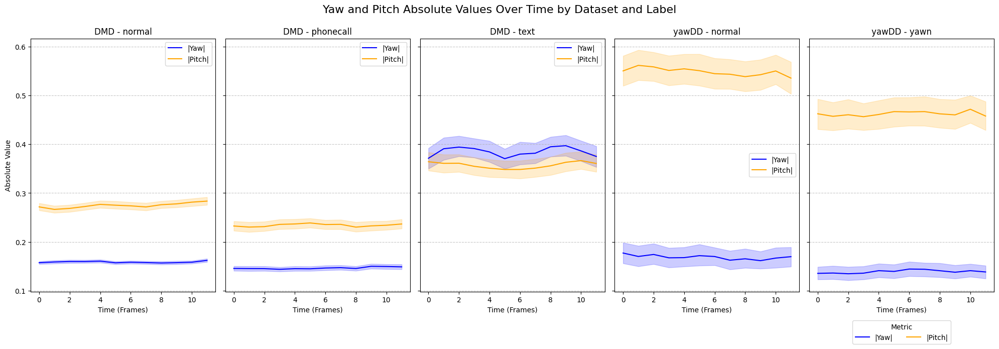

In [ ]:
# 데이터셋과 레이블 조합 정의
plot_configs = [
    {"dataset": "DMD", "label": "normal"},
    {"dataset": "DMD", "label": "phonecall"},
    {"dataset": "DMD", "label": "text"},
    {"dataset": "yawDD", "label": "normal"},
    {"dataset": "yawDD", "label": "yawn"}
]

# 수평으로 5개의 플롯 생성
fig, axes = plt.subplots(1, 5, figsize=(20, 6), sharey=True)  # y축 공유

for i, config in enumerate(plot_configs):
    dataset = config["dataset"]
    label = config["label"]

    # 데이터 필터링
    subset = df[(df['dataset'] == dataset) & (df['label'] == label)]

    if subset.empty:  # 데이터가 없으면 스킵
        continue

    # Yaw 절댓값 시각화
    sns.lineplot(
        data=subset,
        x='time',
        y=np.abs(subset['yaw']),  # Yaw 절댓값
        ax=axes[i],               # 현재 subplot에 그림
        color="blue",
        label="|Yaw|"
    )

    # Pitch 절댓값 시각화
    sns.lineplot(
        data=subset,
        x='time',
        y=np.abs(subset['pitch']),  # Pitch 절댓값
        ax=axes[i],                 # 현재 subplot에 그림
        color="orange",
        label="|Pitch|"
    )

    # 제목 설정
    axes[i].set_title(f"{dataset} - {label}")

    # x축과 y축 레이블 설정
    axes[i].set_xlabel("Time (Frames)")
    if i == 0:  # 첫 번째 플롯만 y축 레이블 표시
        axes[i].set_ylabel("Absolute Value")

    # y축 그리드 추가
    axes[i].grid(axis='y', linestyle='--', alpha=0.7)  # 점선 스타일과 투명도 설정

# 전체 레이아웃 조정 및 범례 추가
plt.tight_layout()
plt.legend(title="Metric", loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=2)
plt.suptitle("Yaw and Pitch Absolute Values Over Time by Dataset and Label", fontsize=16, y=1.05)
plt.show()

## 시간 흐름별 yaw, pitch 절댓값 추이(mirror, dash 분리)

In [ ]:
sns.set_theme(style="whitegrid")
color_palette = sns.color_palette("Set2")

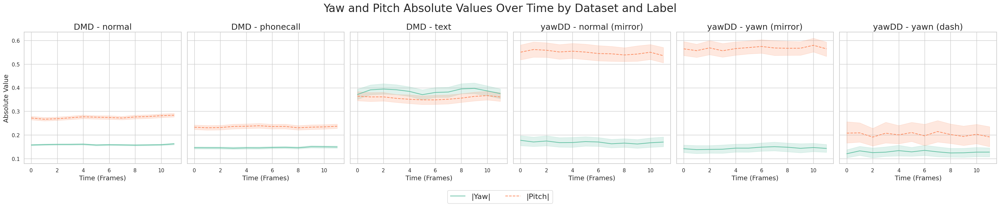

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Seaborn 스타일 설정
sns.set_theme(style="whitegrid")
color_palette = sns.color_palette("Set2")

# 데이터셋과 레이블 조합 정의 (yawDD-yawn을 mirror와 dash로 나눔)
plot_configs = [
    {"dataset": "DMD", "label": "normal"},
    {"dataset": "DMD", "label": "phonecall"},
    {"dataset": "DMD", "label": "text"},
    {"dataset": "yawDD", "label": "normal", "prefix": "mirror"},
    {"dataset": "yawDD", "label": "yawn", "prefix": "mirror"},  # mirror 추가
    {"dataset": "yawDD", "label": "yawn", "prefix": "dash"}     # dash 추가
]

# 1행 6열로 플롯 생성
fig, axes = plt.subplots(1, len(plot_configs), figsize=(30, 6), sharey=True)  # y축 공유

# 범례 핸들 및 라벨 저장용 리스트
all_handles = []
all_labels = []

for i, config in enumerate(plot_configs):
    dataset = config["dataset"]
    label = config["label"]
    prefix = config.get("prefix", None)  # prefix 키가 없으면 None 반환

    # 데이터 필터링
    if prefix:  # prefix가 있는 경우 (yawDD-yawn의 mirror 또는 dash)
        subset = df[
            (df['dataset'] == dataset) &
            (df['label'] == label) &
            (df['video_name'].str.split("_").str[0].str.startswith(prefix))
        ]
        title = f"{dataset} - {label} ({prefix})"
    else:  # 일반적인 dataset-label 조합
        subset = df[
            (df['dataset'] == dataset) &
            (df['label'] == label)
        ]
        title = f"{dataset} - {label}"

    if subset.empty:  # 데이터가 없으면 텍스트 표시
        axes[i].text(0.5, 0.5, 'No Data Available', ha='center', va='center', fontsize=12, color='gray')
        axes[i].set_visible(True)
        axes[i].set_title(title, fontsize=18)
        continue

    # Yaw 절댓값 시각화
    yaw_line = sns.lineplot(
        data=subset,
        x='time',
        y=np.abs(subset['yaw']),  # Yaw 절댓값
        ax=axes[i],               # 현재 subplot에 그림
        color=color_palette[0],
        linestyle='solid',
        legend=False,
        label="|Yaw|"             # 라벨 지정
    )

    # Pitch 절댓값 시각화
    pitch_line = sns.lineplot(
        data=subset,
        x='time',
        y=np.abs(subset['pitch']),  # Pitch 절댓값
        ax=axes[i],                 # 현재 subplot에 그림
        color=color_palette[1],
        linestyle='dashed',
        legend=False,
        label="|Pitch|"             # 라벨 지정
    )

    # 첫 번째 플롯에서만 핸들 및 라벨 수집 (범례용)
    handles, labels = axes[i].get_legend_handles_labels()
    if i == 0:
        all_handles.extend(handles)
        all_labels.extend(labels)

    # 제목 설정
    axes[i].set_title(title, fontsize=18)

    # x축 레이블 설정 (공유된 y축은 첫 번째 플롯만 표시)
    axes[i].set_xlabel("Time (Frames)", fontsize=14)
    if i == 0:
        axes[i].set_ylabel("Absolute Value", fontsize=14)

# 전체 플롯에 대해 하나의 범례 추가
fig.legend(
    handles=all_handles,          # 저장된 핸들을 사용해 범례 생성
    labels=all_labels,            # 저장된 라벨을 사용해 범례 생성
    loc='lower center',           # 범례를 하단 중앙으로 이동
    ncol=2,                       # 두 열로 정렬
    fontsize=16,
    frameon=True,
)

# 전체 레이아웃 조정 및 제목 추가
plt.tight_layout(rect=[0, 0.1, 1, 0.95])  # 제목과 그래프 간 여백 조정 (rect 조정)
plt.suptitle("Yaw and Pitch Absolute Values Over Time by Dataset and Label", fontsize=24, y=1.02)  # 전체 제목 글씨 크기 확대 및 위치 조정
plt.show()


## frame별 yaw, pitch 절댓값 분포

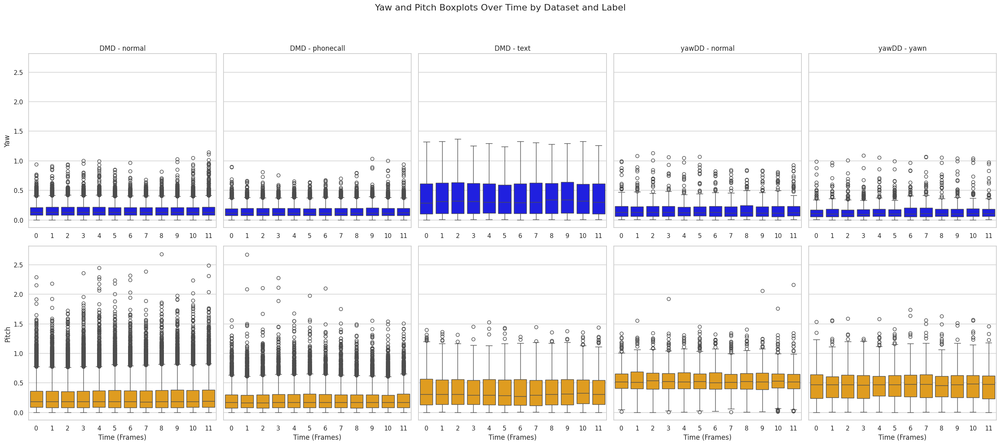

In [ ]:
# 데이터셋과 레이블 조합 정의
plot_configs = [
    {"dataset": "DMD", "label": "normal"},
    {"dataset": "DMD", "label": "phonecall"},
    {"dataset": "DMD", "label": "text"},
    {"dataset": "yawDD", "label": "normal"},
    {"dataset": "yawDD", "label": "yawn"}
]

# 2행 5열의 플롯 생성 (1행: yaw, 2행: pitch, y축 공유)
fig, axes = plt.subplots(2, 5, figsize=(25, 12), sharey=True)  # y축 공유

for i, config in enumerate(plot_configs):
    dataset = config["dataset"]
    label = config["label"]

    # 데이터 필터링
    subset = df[(df['dataset'] == dataset) & (df['label'] == label)]

    if subset.empty:  # 데이터가 없으면 스킵
        continue

    # Yaw Boxplot 시각화 (1행)
    sns.boxplot(
        data=subset,
        x='time',
        y=np.abs(subset['yaw']),  # Yaw 절댓값
        ax=axes[0, i],
        color="blue"
    )
    axes[0, i].set_title(f"{dataset} - {label}")  # 제목 설정
    axes[0, i].set_xlabel(None)
    if i == 0:
        axes[0, i].set_ylabel("Yaw")  # 첫 번째 열만 y축 레이블 표시

    # Pitch Boxplot 시각화 (2행)
    sns.boxplot(
        data=subset,
        x='time',
        y=np.abs(subset['pitch']),  # Pitch 절댓값
        ax=axes[1, i],
        color="orange"
    )
    axes[1, i].set_xlabel("Time (Frames)")
    if i == 0:
        axes[1, i].set_ylabel("Pitch")  # 첫 번째 열만 y축 레이블 표시

plt.tight_layout(rect=[0, 0.1, 1, 0.95])  # 제목과 그래프 간 여백 조정 (rect 조정)
plt.suptitle("Yaw and Pitch Boxplots Over Time by Dataset and Label", fontsize=16, y=1.02)
plt.show()

## frame별 yaw, pitch 절댓값 분포(mirror, dash 분리)

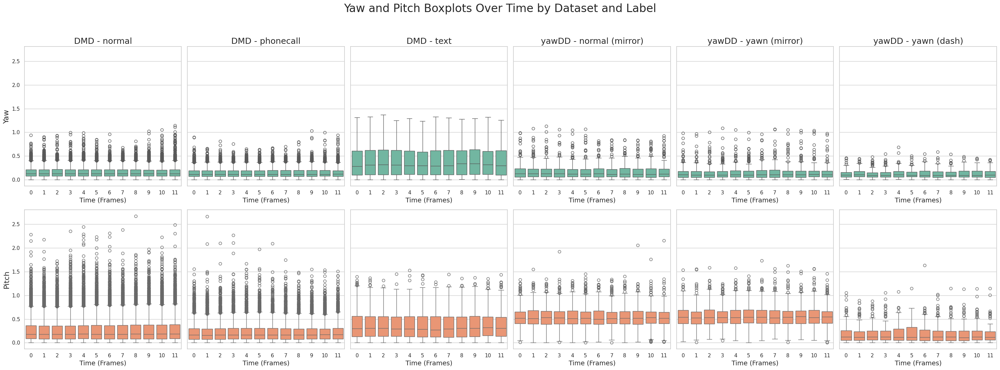

In [ ]:
# 데이터셋과 레이블 조합 정의 (yawDD-yawn을 mirror와 dash로 나눔)
plot_configs = [
    {"dataset": "DMD", "label": "normal"},
    {"dataset": "DMD", "label": "phonecall"},
    {"dataset": "DMD", "label": "text"},
    {"dataset": "yawDD", "label": "normal", "prefix": "mirror"},
    {"dataset": "yawDD", "label": "yawn", "prefix": "mirror"},  # mirror 추가
    {"dataset": "yawDD", "label": "yawn", "prefix": "dash"}     # dash 추가
]

# 2행 6열의 플롯 생성 (1행: yaw, 2행: pitch, y축 공유)
fig, axes = plt.subplots(2, len(plot_configs), figsize=(30, 12), sharey=True)  # y축 공유

for i, config in enumerate(plot_configs):
    dataset = config["dataset"]
    label = config["label"]
    prefix = config.get("prefix", None)  # prefix 키가 없으면 None 반환

    # 데이터 필터링
    if prefix:  # prefix가 있는 경우 (yawDD-yawn의 mirror 또는 dash)
        subset = df[
            (df['dataset'] == dataset) &
            (df['label'] == label) &
            (df['video_name'].str.split("_").str[0].str.startswith(prefix))  # 수정된 부분
        ]
        title = f"{dataset} - {label} ({prefix})"
    else:  # 일반적인 dataset-label 조합
        subset = df[
            (df['dataset'] == dataset) &
            (df['label'] == label)
        ]
        title = f"{dataset} - {label}"

    if subset.empty:  # 데이터가 없으면 스킵
        axes[0, i].set_visible(False)
        axes[1, i].set_visible(False)
        continue

    # Yaw Boxplot 시각화 (1행)
    sns.boxplot(
        data=subset,
        x='time',
        y=np.abs(subset['yaw']),  # Yaw 절댓값
        color=color_palette[0],
        ax=axes[0, i]
    )
    axes[0, i].set_title(title, fontsize=18)  # 제목 글씨 크기 확대
    axes[0, i].set_xlabel("Time (Frames)", fontsize=14)  # x축 레이블 글씨 크기 확대
    if i == 0:
        axes[0, i].set_ylabel("Yaw", fontsize=16)  # y축 레이블 글씨 크기 확대

    # Pitch Boxplot 시각화 (2행)
    sns.boxplot(
        data=subset,
        x='time',
        y=np.abs(subset['pitch']),  # Pitch 절댓값
        color=color_palette[1],
        ax=axes[1, i]
    )
    axes[1, i].set_xlabel("Time (Frames)", fontsize=14)  # x축 레이블 글씨 크기 확대
    if i == 0:
        axes[1, i].set_ylabel("Pitch", fontsize=16)  # y축 레이블 글씨 크기 확대

# 전체 레이아웃 조정 및 제목 추가
plt.tight_layout(rect=[0, 0.1, 1, 0.95])  # 제목과 그래프 간 여백 조정 (rect 조정)
plt.suptitle("Yaw and Pitch Boxplots Over Time by Dataset and Label", fontsize=24, y=1.02)  # 전체 제목 글씨 크기 확대
plt.show()

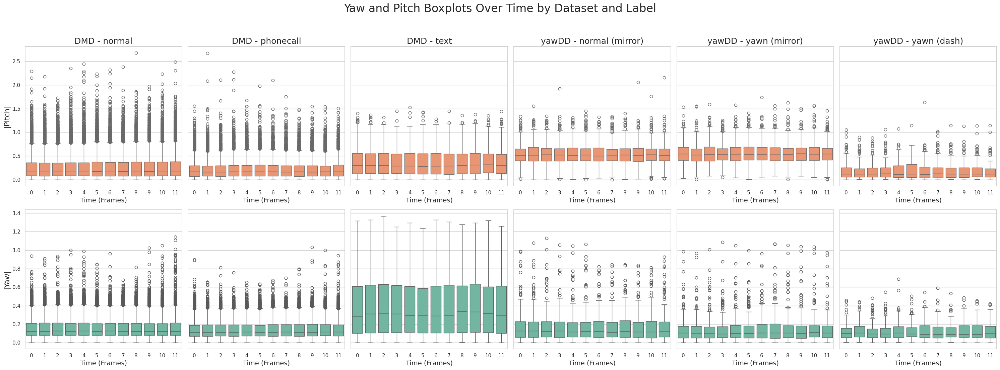

In [ ]:
# 데이터셋과 레이블 조합 정의 (yawDD-yawn을 mirror와 dash로 나눔)
plot_configs = [
    {"dataset": "DMD", "label": "normal"},
    {"dataset": "DMD", "label": "phonecall"},
    {"dataset": "DMD", "label": "text"},
    {"dataset": "yawDD", "label": "normal", "prefix": "mirror"},
    {"dataset": "yawDD", "label": "yawn", "prefix": "mirror"},  # mirror 추가
    {"dataset": "yawDD", "label": "yawn", "prefix": "dash"}     # dash 추가
]

# 2행 6열의 플롯 생성 (1행: yaw, 2행: pitch, y축은 각 행별로 공유)
fig, axes = plt.subplots(2, len(plot_configs), figsize=(30, 12), sharey='row')  # 행별로 y축 공유

for i, config in enumerate(plot_configs):
    dataset = config["dataset"]
    label = config["label"]
    prefix = config.get("prefix", None)  # prefix 키가 없으면 None 반환

    # 데이터 필터링
    if prefix:  # prefix가 있는 경우 (yawDD-yawn의 mirror 또는 dash)
        subset = df[
            (df['dataset'] == dataset) &
            (df['label'] == label) &
            (df['video_name'].str.split("_").str[0].str.startswith(prefix))  # 수정된 부분
        ]
        title = f"{dataset} - {label} ({prefix})"
    else:  # 일반적인 dataset-label 조합
        subset = df[
            (df['dataset'] == dataset) &
            (df['label'] == label)
        ]
        title = f"{dataset} - {label}"

    if subset.empty:  # 데이터가 없으면 스킵
        axes[0, i].set_visible(False)
        axes[1, i].set_visible(False)
        continue

    # Yaw Boxplot 시각화 (1행)
    sns.boxplot(
        data=subset,
        x='time',
        y=np.abs(subset['yaw']),  # Yaw 절댓값
        color=color_palette[0],
        ax=axes[1, i]
    )
    axes[0, i].set_title(title, fontsize=18)  # 제목 글씨 크기 확대
    axes[0, i].set_xlabel("Time (Frames)", fontsize=14)  # x축 레이블 글씨 크기 확대
    axes[1, i].set_ylabel("|Yaw|", fontsize=16)  # y축 레이블 글씨 크기 확대

    # Pitch Boxplot 시각화 (2행)
    sns.boxplot(
        data=subset,
        x='time',
        y=np.abs(subset['pitch']),  # Pitch 절댓값
        color=color_palette[1],
        ax=axes[0, i]
    )
    axes[1, i].set_xlabel("Time (Frames)", fontsize=14)  # x축 레이블 글씨 크기 확대
    axes[0, i].set_ylabel("|Pitch|", fontsize=16)  # y축 레이블 글씨 크기 확대

# 전체 레이아웃 조정 및 제목 추가
plt.tight_layout(rect=[0, 0.1, 1, 0.95])  # 제목과 그래프 간 여백 조정 (rect 조정)
plt.suptitle("Yaw and Pitch Boxplots Over Time by Dataset and Label", fontsize=24, y=1.02)  # 전체 제목 글씨 크기 확대
plt.show()

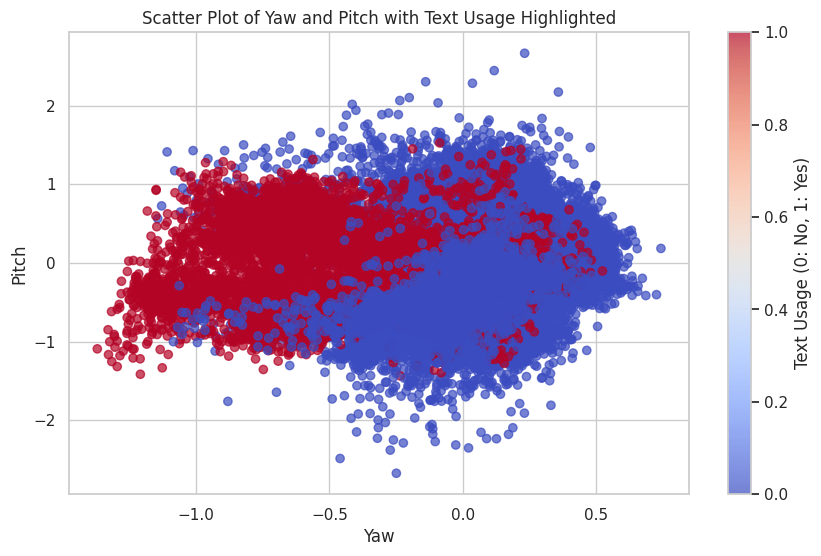

In [ ]:
df["text_usage"] = (df['label'] == 'text').astype(int)
plt.figure(figsize=(10, 6))
plt.scatter(df["yaw"], df["pitch"], c=df["text_usage"], cmap='coolwarm', alpha=0.7)
plt.xlabel("Yaw")
plt.ylabel("Pitch")
plt.title("Scatter Plot of Yaw and Pitch with Text Usage Highlighted")
plt.colorbar(label="Text Usage (0: No, 1: Yes)")
plt.show()

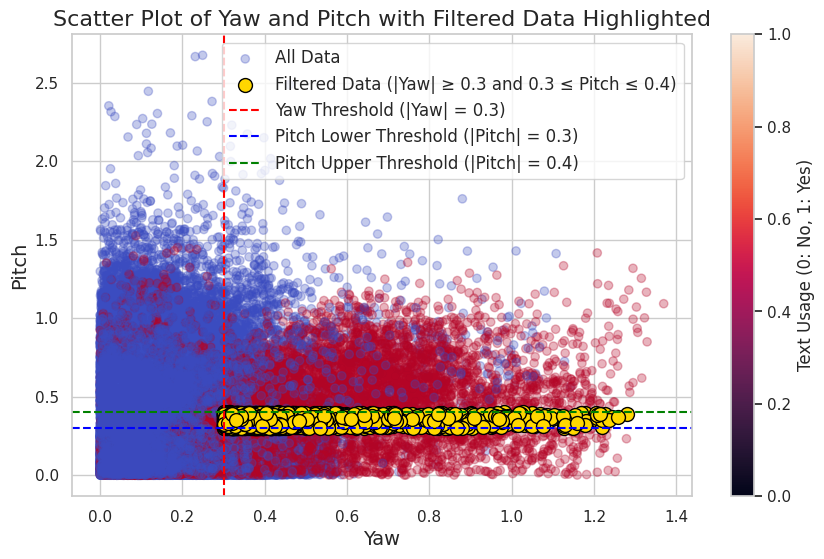

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# 데이터 필터링 조건
filtered_data = df[
    (np.abs(df["yaw"]) >= 0.3) &  # Yaw 절댓값이 0.3 이상
    (np.abs(df["pitch"]) >= 0.3) &       # Pitch가 0.3 이상
    (np.abs(df["pitch"]) <= 0.4)         # Pitch가 0.4 이하
]

text_usage = (df['label'] == 'text').astype(int)

# 산점도 작성
plt.figure(figsize=(10, 6))

# 전체 데이터 산점도 (배경으로 표시)
plt.scatter(np.abs(df["yaw"]), np.abs(df["pitch"]), c=text_usage, cmap='coolwarm', alpha=0.3, label="All Data")

# 필터링된 데이터 산점도 (강조 표시)
plt.scatter(
    np.abs(filtered_data["yaw"]),
    np.abs(filtered_data["pitch"]),
    c='gold',
    edgecolor='black',
    s=100,
    label="Filtered Data (|Yaw| ≥ 0.3 and 0.3 ≤ Pitch ≤ 0.4)"
)

# 임계값 표시
plt.axvline(x=0.3, color='red', linestyle='--', label="Yaw Threshold (|Yaw| = 0.3)")
plt.axhline(y=0.3, color='blue', linestyle='--', label="Pitch Lower Threshold (|Pitch| = 0.3)")
plt.axhline(y=0.4, color='green', linestyle='--', label="Pitch Upper Threshold (|Pitch| = 0.4)")

# 축 및 제목 설정
plt.xlabel("Yaw", fontsize=14)
plt.ylabel("Pitch", fontsize=14)
plt.title("Scatter Plot of Yaw and Pitch with Filtered Data Highlighted", fontsize=16)

# 범례 및 색상바 추가
plt.legend(fontsize=12)
plt.colorbar(label="Text Usage (0: No, 1: Yes)")
plt.show()

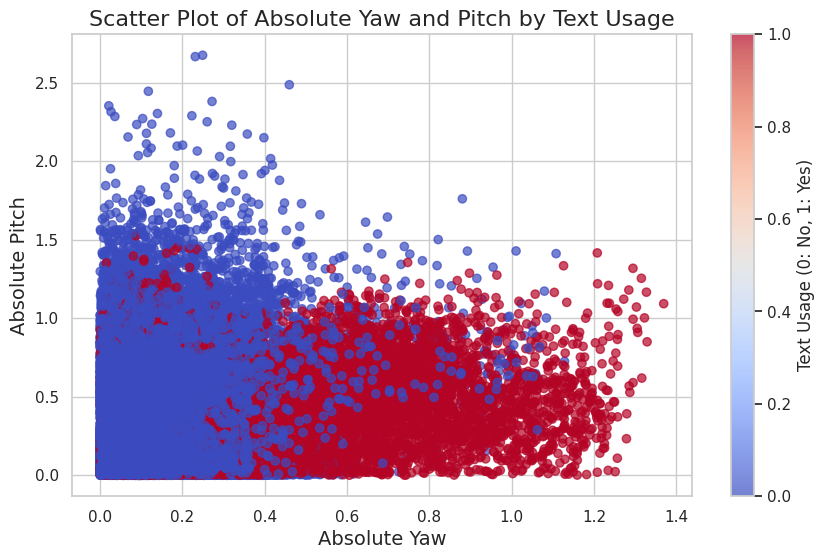

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Yaw와 Pitch의 절댓값 계산
df['abs_yaw'] = np.abs(df['yaw'])
df['abs_pitch'] = np.abs(df['pitch'])

# 문자 사용 여부 (0: No, 1: Yes)
text_usage = (df['label'] == 'text').astype(int)

# 산점도 작성
plt.figure(figsize=(10, 6))

# 문자 사용 여부에 따라 색상 구분
plt.scatter(
    df['abs_yaw'],
    df['abs_pitch'],
    c=text_usage,
    cmap='coolwarm',
    alpha=0.7,
    label="Data Points"
)

# 축 및 제목 설정
plt.xlabel("Absolute Yaw", fontsize=14)
plt.ylabel("Absolute Pitch", fontsize=14)
plt.title("Scatter Plot of Absolute Yaw and Pitch by Text Usage", fontsize=16)

# 색상바 추가 (문자 사용 여부)
plt.colorbar(label="Text Usage (0: No, 1: Yes)")

# 그래프 표시
plt.show()

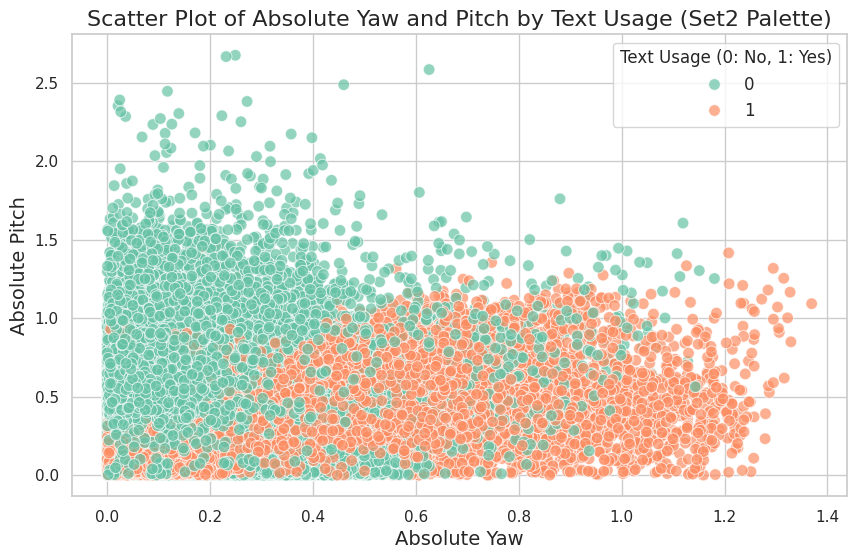

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Seaborn의 Set2 팔레트 설정
palette = sns.color_palette("Set2", 2)  # Set2에서 두 가지 색상 사용

# Yaw와 Pitch의 절댓값 계산
df['abs_yaw'] = np.abs(df['yaw'])
df['abs_pitch'] = np.abs(df['pitch'])

# 문자 사용 여부 (0: No, 1: Yes)
text_usage = (df['label'] == 'text').astype(int)

# 산점도 작성
plt.figure(figsize=(10, 6))

# 문자 사용 여부에 따라 색상 구분 (Set2 팔레트 적용)
sns.scatterplot(
    x=df['abs_yaw'],
    y=df['abs_pitch'],
    hue=text_usage,
    palette=palette,
    alpha=0.7,
    s=70  # 점 크기 설정
)

# 축 및 제목 설정
plt.xlabel("Absolute Yaw", fontsize=14)
plt.ylabel("Absolute Pitch", fontsize=14)
plt.title("Scatter Plot of Absolute Yaw and Pitch by Text Usage (Set2 Palette)", fontsize=16)

# 범례 및 그래프 표시
plt.legend(title="Text Usage (0: No, 1: Yes)", fontsize=12)
plt.show()